In [1]:
import pyarrow as pa
import pyarrow.parquet as pq
import pyarrow.compute as pc
import pyarrow.dataset as ds
import pandas as pd
import duckdb
import numpy as np
import altair as alt
import json
from urllib.request import urlopen
import time
import os
import plotly.express as px

# 读取文件

In [2]:
poet = pd.read_csv('../../CCGIV/datasets/WomenWriting/poet.csv')
poem = pd.read_csv('../../CCGIV/datasets/WomenWriting/poem.csv')
poempoetlinks = pd.read_csv('../../CCGIV/datasets/WomenWriting/poempoetlinks.csv')
subwork = pd.read_csv('../../CCGIV/datasets/WomenWriting/subwork.csv')
subworkpoemlinks = pd.read_csv('../../CCGIV/datasets/WomenWriting/subworkpoemlinks.csv')
subworkpoetlinks = pd.read_csv('../../CCGIV/datasets/WomenWriting/subworkpoetlinks.csv')
work = pd.read_csv('../../CCGIV/datasets/WomenWriting/work.csv')
workpoemlinks = pd.read_csv('../../CCGIV/datasets/WomenWriting/workpoemlinks.csv')
workpoetlinks = pd.read_csv('../../CCGIV/datasets/WomenWriting/workpoetlinks.csv')

In [3]:
poet.fillna(value=np.nan, inplace=True)
poem.fillna(value=np.nan, inplace=True)

In [4]:
# poet.to_parquet('poet.parquet')
# poem.to_parquet('poem.parquet')
# poempoetlinks.to_parquet('poempoetlinks.parquet')
# subwork.to_parquet('subwork.parquet')
# subworkpoemlinks.to_parquet('subworkpoemlinks.parquet')
# subworkpoetlinks.to_parquet('subworkpoetlinks.parquet')
# work.to_parquet('work.parquet')
# workpoemlinks.to_parquet('workpoemlinks.parquet')
# workpoetlinks.to_parquet('workpoetlinks.parquet')

In [5]:
con = duckdb.connect()
con.register('poet', poet)
con.register('poem', poem)
con.register('poempoetlinks', poempoetlinks)
con.register('subwork', subwork)
con.register('subworkpoemlinks', subworkpoemlinks)
con.register('subworkpoetlinks', subworkpoetlinks)
con.register('work', work)
con.register('workpoemlinks', workpoemlinks)
con.register('workpoetlinks', workpoetlinks)

# 全部Genre

In [6]:
peomGroupSQL = '''SELECT genreHZ, COUNT(*) AS num_poems FROM poem GROUP BY genreHZ ORDER BY num_poems DESC'''
groupedPeom = duckdb.query(peomGroupSQL).df()
groupedPeom

,GenreHZ,num_poems
0,詩,58044
1,詞,11608
2,文﹕略傳,6490
3,None,4989
4,文﹕詩話,2840
5,文﹕文,1548
6,文﹕案語,1039
7,文﹕序,956
8,文﹕書信,702
9,文﹕跋,334


In [7]:
peomGroupSQL = '''SELECT genrePY, COUNT(*) AS num_poems FROM poem GROUP BY genrePY ORDER BY num_poems DESC'''
groupedPeom = duckdb.query(peomGroupSQL).df()
groupedPeom
# Wen: lue zhuan 和 Wen: lüe zhuan其实是一类

,GenrePY,num_poems
0,shi,58044
1,ci,11608
2,None,4989
3,Wen: lue zhuan,3655
4,Wen: Shi hua,2840
5,Wen: lüe zhuan,2835
6,Wen: Wen,1548
7,Wen: An yu,1039
8,Wen: Xu,956
9,Wen: Shu xin,702


# 詞的二级分类（词牌名）

In [7]:
quryGenre = '''SELECT DISTINCT TitleHZ FROM poem WHERE GenreHZ='詞' '''
result = duckdb.query(quryGenre).df()
result

,TitleHZ
0,長相思
1,臺城路
2,沁園春
3,調笑令
4,清平樂
...,...
1501,柳梢青
1502,減字木蘭花
1503,城頭月
1504,愁倚闌令


In [8]:
quryGenre = '''SELECT DISTINCT 
        CASE 
            WHEN instr(TitleHZ, '前調') = 1 THEN substr(TitleHZ, instr(TitleHZ, '[') + 1, instr(TitleHZ, ']') - instr(TitleHZ, '[') - 1)
        ELSE TitleHZ
        END AS TitleHZ,COUNT(*) AS count
        FROM poem 
        WHERE GenreHZ='詞'
        GROUP BY TitleHZ
        HAVING count > 1
        ORDER BY count DESC'''
result = duckdb.query(quryGenre).df()
count_distribution = result['count'].value_counts(ascending=False)
# count_distribution
result

,TitleHZ,count
0,菩薩蠻,424
1,浪淘沙,279
2,金縷曲,255
3,浣溪沙,239
4,如夢令,231
...,...,...
725,採桑子,2
726,秋思耗,2
727,開元樂,2
728,桂殿秌,2


In [9]:
cipaiming = result['TitleHZ']

# 詩的二级分类（诗体）

In [11]:
quryGenre = '''SELECT Form,COUNT(*) FROM poem WHERE GenreHZ='詩' GROUP BY Form '''
result = duckdb.query(quryGenre).df()
result

,Form,count_star()
0,七言絕句,21336
1,七言排律,233
2,七言律詩,16118
3,四言詩,190
4,五言排律,618
5,三言詩,11
6,五言古詩,3636
7,None,302
8,七言聯句,176
9,七言古詩,2252


In [11]:
poemForms = result['Form']

# 曲的二级分类（曲排名）

In [12]:
quryGenre = '''SELECT DISTINCT TitleHZ FROM poem WHERE GenreHZ='曲' '''
result = duckdb.query(quryGenre).df()
result

,TitleHZ
0,前腔[羅江怨]
1,前腔[綿搭絮]
2,南園林好
3,前腔[山坡羊]
4,懶畫眉
...,...
163,鳩婦怨:啄木鸝
164,前調
165,自序一闋:小桃紅
166,禿嘶兒


In [13]:
qupaiming = result['TitleHZ']

# 文的二级分类（文体）

In [14]:
quryGenre = '''SELECT DISTINCT GenreHZ
FROM poem
WHERE GenreHZ LIKE '文%' '''
result = duckdb.query(quryGenre).df()
result
# 文：說 - 文后面没有空格

,GenreHZ
0,文﹕疏
1,文﹕啟
2,文﹕令
3,文﹕附記
4,文﹕像贊
5,文﹕彈詞
6,文﹕序
7,文﹕詩話
8,文﹕策
9,文﹕勑


In [15]:
wenForms = result['GenreHZ']

In [16]:
# quryGenre = '''SELECT DISTINCT
#   CASE
#     WHEN strpos(GenreHZ, '：') > 0 THEN substr(GenreHZ, strpos(GenreHZ, '：') + 1)
#     WHEN strpos(GenreHZ, '﹕') > 0 THEN substr(GenreHZ, strpos(GenreHZ, '﹕') + 1)
#     ELSE GenreHZ
#   END AS ExtractedGenre
# FROM poem
# WHERE GenreHZ LIKE '文%' '''
# result = duckdb.query(quryGenre).df()
# result

# 上面的32和42合并了

In [17]:
# wenForms = result['ExtractedGenre']

In [18]:
# 把文合为一类，有的既是诗话又是略传，但是其实都算是文
peomGroupSQL = '''SELECT
  CASE
    WHEN genreHZ LIKE '文%' THEN '文'
    ELSE genreHZ          
  END AS genre_group,
  COUNT(*) AS num_poems
FROM poem
GROUP BY genre_group
ORDER BY num_poems DESC'''
groupedPeom = duckdb.query(peomGroupSQL).df()
groupedPeom

,genre_group,num_poems
0,詩,58044
1,文,16567
2,詞,11608
3,None,4989
4,圖,282
5,詩話，略傳,257
6,曲,249
7,對聯,81
8,照片,17


In [19]:
# 把 對聯 和 詩話，略傳 合并到文，把 圖 和 照片 合并
peomGroupSQL = '''SELECT
  CASE
    WHEN genreHZ LIKE '文%' OR genreHZ LIKE '%詩話%' OR genreHZ LIKE '%略傳%' OR genreHZ LIKE '%對聯%' THEN '文'
    WHEN genreHZ = '照片' OR genreHZ = '圖' THEN '圖'
    ELSE genreHZ          
  END AS genre_group,
  COUNT(*) AS num_poems
FROM poem
GROUP BY genre_group
ORDER BY num_poems DESC'''
groupedPeom = duckdb.query(peomGroupSQL).df()
groupedPeom

,genre_group,num_poems
0,詩,58044
1,文,16905
2,詞,11608
3,None,4989
4,圖,299
5,曲,249


In [20]:
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram

In [21]:
data = {
    'Genre': groupedPeom['genre_group'],
    'Count': groupedPeom['num_poems']
}
data

{'Genre': 0       詩
 1       文
 2       詞
 3    None
 4       圖
 5       曲
 Name: genre_group, dtype: object,
 'Count': 0    58044
 1    16905
 2    11608
 3     4989
 4      299
 5      249
 Name: num_poems, dtype: int64}

# 把作品按以及分类（体裁）和二级分类标注

In [22]:
peomGroupSQL = '''SELECT poemID,
    genreHZ,
    CASE 
        WHEN genreHZ LIKE '詩' THEN '詩'
        WHEN genreHZ LIKE '文%' OR genreHZ LIKE '%詩話%' OR genreHZ LIKE '%略傳%' OR genreHZ LIKE '%對聯%' THEN '文'
        WHEN genreHZ LIKE '詞' THEN '詞'
        WHEN genreHZ IS NULL THEN 'None'
        WHEN genreHZ = '照片' OR genreHZ = '圖' THEN '圖'
        WHEN genreHZ LIKE '曲' THEN '曲'
        ELSE '其他'
    END AS Level1,
    CASE
        WHEN genreHZ LIKE '詩' AND Form IN (''' + ", ".join(f"'{form}'" for form in poemForms) + ''') 
            THEN Form 
        WHEN genreHZ LIKE '詞' AND TitleHZ IN (''' + ", ".join(f"'{title}'" for title in cipaiming) + ''') 
            THEN TitleHZ
        WHEN genreHZ LIKE '曲' AND TitleHZ IN (''' + ", ".join(f"'{form}'" for form in qupaiming) + ''') 
            THEN TitleHZ
        WHEN genreHZ LIKE '文%' AND GenreHZ IN (''' + ", ".join(f"'{form}'" for form in wenForms) + ''') 
            THEN GenreHZ
        ELSE 'None'
    END AS Level2
FROM
    poem
ORDER BY
    poemID;'''
groupedPeom = duckdb.query(peomGroupSQL).df()
groupedPeom

,poemID,GenreHZ,Level1,Level2
0,6,詩,詩,五言律詩
1,7,詩,詩,七言絕句
2,8,詩,詩,七言絕句
3,9,詩,詩,五言古詩
4,10,詩,詩,七言絕句
...,...,...,...,...
92089,97303,詩,詩,五言絕句
92090,97304,文﹕案語,文,文﹕案語
92091,97305,None,None,None
92092,97306,None,None,None


In [23]:
result = {'name': 'flare', 'children': []}
for level1 in groupedPeom['Level1'].unique():
    level1_group = groupedPeom[groupedPeom['Level1'] == level1]
    level1_dict = {'name': level1, 'children': []}
    for level2 in level1_group['Level2'].unique():
        level2_group = level1_group[level1_group['Level2'] == level2]
        level2_dict = {'name': level2, 'children': [{'name': f'PoemID {pid}'} for pid in level2_group['poemID']]}
        level1_dict['children'].append(level2_dict)
    result['children'].append(level1_dict)

In [24]:
result

{'name': 'flare',
 'children': [{'name': '詩',
   'children': [{'name': '五言律詩',
     'children': [{'name': 'PoemID 6'},
      {'name': 'PoemID 15'},
      {'name': 'PoemID 20'},
      {'name': 'PoemID 27'},
      {'name': 'PoemID 37'},
      {'name': 'PoemID 38'},
      {'name': 'PoemID 43'},
      {'name': 'PoemID 46'},
      {'name': 'PoemID 48'},
      {'name': 'PoemID 52'},
      {'name': 'PoemID 53'},
      {'name': 'PoemID 64'},
      {'name': 'PoemID 68'},
      {'name': 'PoemID 77'},
      {'name': 'PoemID 78'},
      {'name': 'PoemID 81'},
      {'name': 'PoemID 84'},
      {'name': 'PoemID 86'},
      {'name': 'PoemID 87'},
      {'name': 'PoemID 89'},
      {'name': 'PoemID 93'},
      {'name': 'PoemID 97'},
      {'name': 'PoemID 101'},
      {'name': 'PoemID 107'},
      {'name': 'PoemID 108'},
      {'name': 'PoemID 110'},
      {'name': 'PoemID 112'},
      {'name': 'PoemID 120'},
      {'name': 'PoemID 123'},
      {'name': 'PoemID 130'},
      {'name': 'PoemID 134'},
  

In [25]:
import json


file_path = 'output.json'  
with open(file_path, 'w', encoding='utf-8') as file:
    json.dump(result, file, ensure_ascii=False, indent=2)

print(f"Data has been written to {file_path}")

Data has been written to output.json


In [26]:
level2_counts = groupedPeom.groupby(['Level1', 'Level2']).size().reset_index(name='count')

In [27]:
result1 = {'name': 'flare', 'children': []}
for level1, group in level2_counts.groupby('Level1'):
    level1_dict = {'name': level1, 'children': []}
    for idx, row in group.iterrows():
        level1_dict['children'].append({'name': row['Level2'], 'value': int(row['count'])})
    result1['children'].append(level1_dict)

import json
print(json.dumps(result1, indent=2))

{
  "name": "flare",
  "children": [
    {
      "name": "None",
      "children": [
        {
          "name": "None",
          "value": 4989
        }
      ]
    },
    {
      "name": "\u5716",
      "children": [
        {
          "name": "None",
          "value": 299
        }
      ]
    },
    {
      "name": "\u6587",
      "children": [
        {
          "name": "None",
          "value": 338
        },
        {
          "name": "\u6587",
          "value": 175
        },
        {
          "name": "\u6587\ufe55\u4e0a\u66f8",
          "value": 37
        },
        {
          "name": "\u6587\ufe55\u4ee4",
          "value": 7
        },
        {
          "name": "\u6587\ufe55\u50b3",
          "value": 253
        },
        {
          "name": "\u6587\ufe55\u50cf\u8d0a",
          "value": 21
        },
        {
          "name": "\u6587\ufe55\u51e1\u4f8b",
          "value": 17
        },
        {
          "name": "\u6587\ufe55\u52d1",
          "value": 9


In [28]:
# 写入 JSON 文件
with open('flare.json', 'w', encoding='utf-8') as file:
    json.dump(result1, file, ensure_ascii=False, indent=2)

print("JSON file has been saved.")

JSON file has been saved.


In [29]:
workpoetqury = '''SELECT DISTINCT role, COUNT(*) AS count
FROM workpoetlinks
GROUP BY role'''
poetrole = duckdb.query(workpoetqury).df()
poetrole

,role,count
0,像贊作者,8
1,校註者,3
2,輓詞作者,94
3,題辭,1230
4,序作者,758
5,年譜作者,4
6,傳記作者,113
7,跋作者,214
8,作者,451
9,校閲,12


In [30]:
workGroupSQL = '''SELECT workID, poetID 
                FROM workpoetlinks 
                WHERE role != '作者' AND role!= '主要作者' AND role != '其他作者'
                GROUP BY workID,poetID 
                ORDER BY workID'''
groupedwork = duckdb.query(workGroupSQL).df()
groupedwork

,workID,poetID
0,9,486
1,9,5
2,9,1968
3,9,1951
4,9,1977
...,...,...
2412,480,8139
2413,480,8140
2414,481,8173
2415,482,456


In [31]:
workGroupSQL1 = '''SELECT 
    wpl.workID, 
    wpl.poetID, 
    poem_count_table.poem_count
FROM 
    workpoetlinks wpl
LEFT JOIN 
    (SELECT workID, COUNT(poemID) AS poem_count
     FROM workpoemlinks
     GROUP BY workID) AS poem_count_table
ON 
    wpl.workID = poem_count_table.workID
GROUP BY 
    wpl.workID, wpl.poetID, poem_count_table.poem_count
ORDER BY 
    wpl.workID'''
groupedwork1 = duckdb.query(workGroupSQL1).df()
groupedwork1

,workID,poetID,poem_count
0,9,1968,986.0
1,9,1977,986.0
2,9,328,986.0
3,9,1951,986.0
4,9,4399,986.0
...,...,...,...
3237,480,6081,82.0
3238,481,8173,885.0
3239,482,911,162.0
3240,482,456,162.0


In [32]:
groupedwork1['workID'] = groupedwork1['workID'].apply(lambda x: f'work_{x}')
groupedwork1['poetID'] = groupedwork1['poetID'].apply(lambda x: f'poet_{x}')

nodes = pd.DataFrame({
    'id': pd.concat([
        groupedwork1['workID'],
        groupedwork1['poetID']
    ]).unique()
    
})

groupedwork1['poem_count'] = groupedwork1['poem_count'].fillna(0)

# 在 merge 之前去除重复的 workID
unique_workIDs = groupedwork1[['workID', 'poem_count']].drop_duplicates(subset=['workID'])

# 进行合并，将 poem_count 添加到对应的 workID
nodes = nodes.merge(
    unique_workIDs.rename(columns={'workID': 'id'}),
    on='id', 
    how='left'
)
# 如果是 poet 节点，poem_count 默认为 0 或其他值
nodes['poem_count'] = nodes['poem_count'].fillna(0.5)



nodes['group'] = nodes['id'].apply(lambda x: 'Works' if x.startswith('work_') else 'Poets')


links = []
for index, row in groupedwork1.iterrows():
    links.append({'source': row['workID'], 'target': row['poetID']})

links_df = pd.DataFrame(links)
links_list = links_df.to_dict('records')

nodes_list = nodes.to_dict('records')

network_data1 = {
    'nodes': nodes_list,
    'links': links_list
}


with open('workpoempoetcount.json', 'w', encoding='utf-8') as file:
    json.dump(network_data1, file, ensure_ascii=False, indent=2)

print("JSON file has been saved.")

JSON file has been saved.


In [33]:
network_json1 = json.dumps(network_data1, indent=2)

with open('workpoempoetcount.json', 'w', encoding='utf-8') as f:
    f.write(network_json1)

print("JSON file has been saved.")

JSON file has been saved.


In [34]:
print(groupedwork.columns)

Index(['workID', 'poetID'], dtype='object')


In [35]:
groupedwork['workID'] = groupedwork['workID'].apply(lambda x: f'work_{x}')
groupedwork['poetID'] = groupedwork['poetID'].apply(lambda x: f'poet_{x}')

nodes = pd.DataFrame({
    'id': pd.concat([
        groupedwork['workID'],
        groupedwork['poetID']
    ]).unique()
})
nodes['group'] = nodes['id'].apply(lambda x: 'Works' if x.startswith('work_') else 'Poets')


links = []
for index, row in groupedwork.iterrows():
    links.append({'source': row['workID'], 'target': row['poetID'], 'value': 1})

links_df = pd.DataFrame(links)
links_list = links_df.to_dict('records')

nodes_list = nodes.to_dict('records')

network_data = {
    'nodes': nodes_list,
    'links': links_list
}


network_data

{'nodes': [{'id': 'work_9', 'group': 'Works'},
  {'id': 'work_10', 'group': 'Works'},
  {'id': 'work_11', 'group': 'Works'},
  {'id': 'work_12', 'group': 'Works'},
  {'id': 'work_13', 'group': 'Works'},
  {'id': 'work_14', 'group': 'Works'},
  {'id': 'work_15', 'group': 'Works'},
  {'id': 'work_16', 'group': 'Works'},
  {'id': 'work_17', 'group': 'Works'},
  {'id': 'work_18', 'group': 'Works'},
  {'id': 'work_19', 'group': 'Works'},
  {'id': 'work_20', 'group': 'Works'},
  {'id': 'work_21', 'group': 'Works'},
  {'id': 'work_22', 'group': 'Works'},
  {'id': 'work_23', 'group': 'Works'},
  {'id': 'work_24', 'group': 'Works'},
  {'id': 'work_25', 'group': 'Works'},
  {'id': 'work_26', 'group': 'Works'},
  {'id': 'work_28', 'group': 'Works'},
  {'id': 'work_29', 'group': 'Works'},
  {'id': 'work_30', 'group': 'Works'},
  {'id': 'work_31', 'group': 'Works'},
  {'id': 'work_32', 'group': 'Works'},
  {'id': 'work_33', 'group': 'Works'},
  {'id': 'work_34', 'group': 'Works'},
  {'id': 'work_35

In [36]:
# 使用 default 参数处理 int64 类型
with open('workpoetwithoutmain.json', 'w', encoding='utf-8') as file:
    json.dump(network_data, file, ensure_ascii=False, indent=2)

print("JSON file has been saved.")

JSON file has been saved.


In [37]:
workGroupSQL = '''SELECT workpoetlinks.poetID,workpoetlinks.workID,poet.StartYear 
                FROM workpoetlinks,poet
                WHERE workpoetlinks.poetID = poet.poetID AND role != '作者' AND role!= '主要作者' AND role != '其他作者'
                GROUP BY workpoetlinks.poetID,workpoetlinks.workID ,poet.StartYear 
                ORDER BY workpoetlinks.poetID'''

workgroup = duckdb.query(workGroupSQL).df()
workgroup

,poetID,workID,StartYear
0,5,9,1743
1,6,11,1830
2,12,16,1814
3,16,20,1750
4,28,21,1736
...,...,...,...
2412,8455,473,1740
2413,8456,473,1740
2414,8457,473,1740
2415,8458,473,1740


In [38]:
from itertools import combinations
poet_start_year = workgroup.groupby('poetID')['StartYear'].min().reset_index()
# nodes = [{'id': str(pid), 'group': 1,} for pid in workgroup['poetID'].unique()]
nodes = [{'id': str(row['poetID']), 'group': 1, 'StartYear': str(row['StartYear'])} for _, row in poet_start_year.iterrows()]
nodes

[{'id': '5', 'group': 1, 'StartYear': '1743'},
 {'id': '6', 'group': 1, 'StartYear': '1830'},
 {'id': '12', 'group': 1, 'StartYear': '1814'},
 {'id': '16', 'group': 1, 'StartYear': '1750'},
 {'id': '28', 'group': 1, 'StartYear': '1736'},
 {'id': '32', 'group': 1, 'StartYear': '1821'},
 {'id': '43', 'group': 1, 'StartYear': '1592'},
 {'id': '63', 'group': 1, 'StartYear': '1662'},
 {'id': '72', 'group': 1, 'StartYear': '1728'},
 {'id': '92', 'group': 1, 'StartYear': '1764'},
 {'id': '106', 'group': 1, 'StartYear': '1756'},
 {'id': '108', 'group': 1, 'StartYear': '1766'},
 {'id': '118', 'group': 1, 'StartYear': '1800'},
 {'id': '124', 'group': 1, 'StartYear': '1796'},
 {'id': '126', 'group': 1, 'StartYear': '1797'},
 {'id': '127', 'group': 1, 'StartYear': '1793'},
 {'id': '132', 'group': 1, 'StartYear': '1796'},
 {'id': '145', 'group': 1, 'StartYear': '1800'},
 {'id': '146', 'group': 1, 'StartYear': '1774'},
 {'id': '147', 'group': 1, 'StartYear': '1801'},
 {'id': '154', 'group': 1, 'Star

In [39]:
# from itertools import combinations
# poet_start_year = workgroup.groupby('poetID')['StartYear'].min().reset_index()
# # nodes = [{'id': str(pid), 'group': 1,} for pid in workgroup['poetID'].unique()]
# nodes = [{'id': str(row['poetID']), 'group': 1, 'StartYear': row['StartYear']} for _, row in poet_start_year.iterrows()]


links = []
for work_id, group in workgroup.groupby('workID'):
    poets = group['poetID'].tolist()
    for (source, target) in combinations(poets, 2):
        links.append({'source': str(source), 'target': str(target), 'value': 1})

network_data = {
    'nodes': nodes,
    'links': links
}

print("Nodes:")
print(network_data['nodes'])
print("\nLinks:")
print(network_data['links'])

Nodes:
[{'id': '5', 'group': 1, 'StartYear': '1743'}, {'id': '6', 'group': 1, 'StartYear': '1830'}, {'id': '12', 'group': 1, 'StartYear': '1814'}, {'id': '16', 'group': 1, 'StartYear': '1750'}, {'id': '28', 'group': 1, 'StartYear': '1736'}, {'id': '32', 'group': 1, 'StartYear': '1821'}, {'id': '43', 'group': 1, 'StartYear': '1592'}, {'id': '63', 'group': 1, 'StartYear': '1662'}, {'id': '72', 'group': 1, 'StartYear': '1728'}, {'id': '92', 'group': 1, 'StartYear': '1764'}, {'id': '106', 'group': 1, 'StartYear': '1756'}, {'id': '108', 'group': 1, 'StartYear': '1766'}, {'id': '118', 'group': 1, 'StartYear': '1800'}, {'id': '124', 'group': 1, 'StartYear': '1796'}, {'id': '126', 'group': 1, 'StartYear': '1797'}, {'id': '127', 'group': 1, 'StartYear': '1793'}, {'id': '132', 'group': 1, 'StartYear': '1796'}, {'id': '145', 'group': 1, 'StartYear': '1800'}, {'id': '146', 'group': 1, 'StartYear': '1774'}, {'id': '147', 'group': 1, 'StartYear': '1801'}, {'id': '154', 'group': 1, 'StartYear': '1832

In [40]:
network_json = json.dumps(network_data, indent=2)

with open('network_data_withoutmain.json', 'w', encoding='utf-8') as f:
    f.write(network_json)

print("JSON file has been saved.")

JSON file has been saved.


In [41]:
# poem - poet - startYear - GenreHZ
quryGenreYear = '''SELECT poempoetlinks.poemID,poem.GenreHZ,poet.StartYear
                FROM poem,poempoetlinks,poet
                WHERE poem.poemID = poempoetlinks.poemID AND poempoetlinks.poetID = poet.poetID '''
GenreYear = duckdb.query(quryGenreYear).df()
GenreYear

,poemID,GenreHZ,StartYear
0,7,詩,1691
1,6,詩,1644
2,8,詩,1691
3,9,詩,1628
4,10,詩,1628
...,...,...,...
88588,97301,詩,1766
88589,97302,文﹕案語,1880
88590,97303,詩,1766
88591,97304,文﹕案語,1880


In [42]:
quryGenreYear = '''SELECT poet.StartYear,poem.GenreHZ,COUNT(*) AS count
                FROM poem, poempoetlinks, poet
                WHERE poem.poemID = poempoetlinks.poemID AND poempoetlinks.poetID = poet.poetID
                GROUP BY poem.GenreHZ,poet.StartYear
                '''
GenreYear = duckdb.query(quryGenreYear).df()
GenreYear

,StartYear,GenreHZ,count
0,1662,詩,886
1,1610,詩,104
2,1614,詩,246
3,1668,詩,17
4,1667,詩,10
...,...,...,...
1933,1859,對聯,1
1934,1881,文﹕自序,1
1935,1788,文﹕記,4
1936,1788,文﹕跋,7


In [43]:
genreYearSQL = '''SELECT poet.StartYear, poem.genreHZ,COUNT(*) AS count,
    CASE 
        WHEN genreHZ LIKE '詩' THEN '詩'
        WHEN genreHZ LIKE '文%' OR genreHZ LIKE '%詩話%' OR genreHZ LIKE '%略傳%' OR genreHZ LIKE '%對聯%' THEN '文'
        WHEN genreHZ LIKE '詞' THEN '詞'
        WHEN genreHZ IS NULL THEN 'None'
        WHEN genreHZ = '照片' OR genreHZ = '圖' THEN '圖'
        WHEN genreHZ LIKE '曲' THEN '曲'
        ELSE '其他'
    END AS Level1,
    CASE
        WHEN genreHZ LIKE '詩' AND Form IN (''' + ", ".join(f"'{form}'" for form in poemForms) + ''') 
            THEN Form 
        WHEN genreHZ LIKE '詞' AND TitleHZ IN (''' + ", ".join(f"'{title}'" for title in cipaiming) + ''') 
            THEN TitleHZ
        WHEN genreHZ LIKE '曲' AND TitleHZ IN (''' + ", ".join(f"'{form}'" for form in qupaiming) + ''') 
            THEN TitleHZ
        WHEN genreHZ LIKE '文%' AND GenreHZ IN (''' + ", ".join(f"'{form}'" for form in wenForms) + ''') 
            THEN GenreHZ
        ELSE 'None'
    END AS Level2
FROM poem, poempoetlinks, poet
WHERE poem.poemID = poempoetlinks.poemID AND poempoetlinks.poetID = poet.poetID
GROUP BY poet.StartYear, poem.genreHZ, Level1, Level2
ORDER BY count'''
genreYear = duckdb.query(genreYearSQL).df()
genreYear

,StartYear,GenreHZ,count,Level1,Level2
0,1622,詩,1,詩,樂府
1,1721,詩,1,詩,七言絕句
2,1690,詩,1,詩,七言古詩
3,1715,詩,1,詩,七言律詩
4,1715,詩,1,詩,七言絕句
...,...,...,...,...,...
8195,1644,詩,1331,詩,七言律詩
8196,1885,文﹕詩話,1409,文,文﹕詩話
8197,1644,詩,1515,詩,七言絕句
8198,1771,文﹕略傳,2046,文,文﹕略傳


In [44]:
poemYearSQL = '''SELECT StartYear,count, Level2
FROM genreYear
WHERE Level1 = '詩' AND StartYear>1367
ORDER BY StartYear;'''
poemYear = duckdb.query(poemYearSQL).df()
poemYear

,StartYear,count,Level2
0,1368,1,樂府
1,1368,2,五言律詩
2,1394,3,七言絕句
3,1415,5,騒體
4,1465,6,七言絕句
...,...,...,...
1830,1901,31,五言絕句
1831,1901,68,七言絕句
1832,1904,1,樂府
1833,1910,1,七言律詩


In [45]:
pivot_df = poemYear.pivot_table(index='StartYear', columns='Level2', values='count', aggfunc='sum', fill_value=0)
pivot_df = pivot_df.reset_index()

pivot_df

Level2,StartYear,None,七言古詩,七言律詩,七言排律,七言絕句,七言聯句,三言詩,五言古詩,五言律詩,...,五言絕句,五言聯句,偈,六言詩,其他,四言詩,未定,樂府,雜言詩,騒體
0,1368,0,0,0,0,0,0,0,0,2,...,0,0,0,0,0,0,0,1,0,0
1,1394,0,0,0,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1415,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
3,1465,0,0,0,0,6,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1480,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,1898,0,0,29,0,39,0,0,1,13,...,10,0,0,0,0,0,0,0,0,0
260,1900,2,18,41,0,66,0,0,25,27,...,14,0,0,0,0,0,0,8,0,0
261,1901,0,24,15,1,68,0,0,20,20,...,31,0,0,0,0,0,0,0,0,0
262,1904,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [46]:
pivot_df.to_csv('genre_year_data.csv', index=False, encoding='utf-8-sig')
print("Data has been successfully saved to genre_year_data.csv")

Data has been successfully saved to genre_year_data.csv


In [47]:
ciYearSQL = '''SELECT Level2, StartYear,SUM(count) AS count, 
FROM genreYear
WHERE Level1 = '詞' AND StartYear>1367
GROUP BY StartYear, Level2
ORDER BY Level2,StartYear
'''
ciYear = duckdb.query(ciYearSQL).df()
ciYear

,Level2,StartYear,count
0,(喝火令),1843,1.0
1,(喝火令),1845,1.0
2,(臨江仙),1843,1.0
3,(臨江仙),1845,1.0
4,(菩薩蠻),1843,1.0
...,...,...,...
4378,齊天樂,1860,2.0
4379,齊天樂,1873,1.0
4380,齊天樂,1878,2.0
4381,齊天樂,1883,2.0


In [102]:
import pandas as pd
import altair as alt

alt.data_transformers.enable('vegafusion')


line_chart = alt.Chart(ciYear).mark_line(point=True).encode(
    x='StartYear:Q',
    y='sum(count):Q',
    color='Level2:N',  # 使用不同颜色表示不同词牌名
    tooltip=['StartYear', 'sum(count)', 'Level2']
).properties(
    title="词牌名数量随时间的变化"
)

line_chart

NameError: name 'ciYear' is not defined

In [8]:
ciYear_df = ciYear.pivot_table(index='StartYear', columns='Level2', values='count', aggfunc='sum',fill_value=0)
ciYear_df = ciYear_df.reset_index()

ciYear_df

# 點絳脣	點绛唇	點绛脣

NameError: name 'ciYear' is not defined

In [ ]:
ciYear_df.to_csv('ci_year_data.csv', index=False, encoding='utf-8-sig')
print("Data has been successfully saved to ci_year_data.csv.csv")

In [ ]:
max_value = ciYear_df.drop(columns=['StartYear']).max().max()


In [ ]:
max_value

In [ ]:
max_value = pivot_df.drop(columns=['StartYear']).max().max()
max_value

In [ ]:
import pandas as pd
import altair as alt

alt.data_transformers.enable('vegafusion')


line_chart = alt.Chart(poemYear).mark_line(point=True).encode(
    x='StartYear:Q',
    y='sum(count):Q',
    color='Level2:N',  # 使用不同颜色表示不同词牌名
    tooltip=['StartYear', 'sum(count)', 'Level2']
).properties(
    title="诗体数量随时间的变化"
)

line_chart

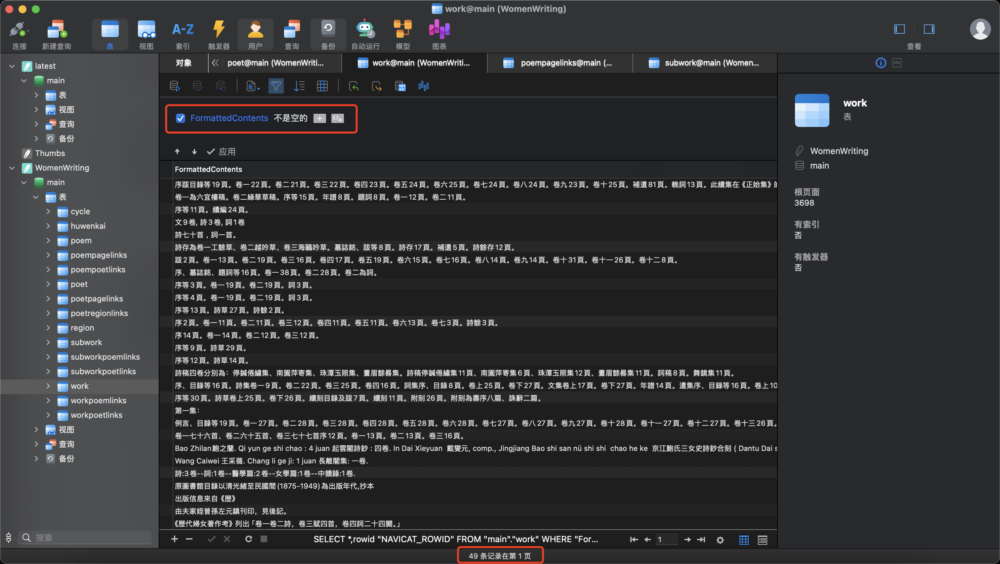

# 又有著作又写诗的作者？

In [103]:
workpoempoetSQL = '''SELECT DISTINCT workpoetlinks.poetID
FROM workpoetlinks,poempoetlinks
WHERE workpoetlinks.poetID = poempoetlinks.poetID
'''
workpoempoet = duckdb.query(workpoempoetSQL).df()
workpoempoet

,poetID
0,238
1,244
2,617
3,55
4,52
...,...
2747,8451
2748,3918
2749,8458
2750,8431


In [104]:
poemselfwork = '''SELECT workpoetlinks.poetID, poempoetlinks.poemID, workpoetlinks.workID
FROM workpoetlinks
JOIN poempoetlinks ON workpoetlinks.poetID = poempoetlinks.poetID
JOIN workpoemlinks ON workpoetlinks.workID = workpoemlinks.workID
WHERE workpoemlinks.poemID = poempoetlinks.poemID;
'''
workpoempoet = duckdb.query(poemselfwork).df()
workpoempoet

,poetID,poemID,workID
0,5,2050,9
1,5,2051,9
2,5,2055,9
3,5,2056,9
4,5,2057,9
...,...,...,...
81529,4636,93710,262
81530,6423,90319,462
81531,8003,87741,440
81532,6423,90319,462


In [ ]:
mainauthorSQL = '''SELECT workID
FROM workpoetlinks
WHERE role IN ('作者', '主要作者')
GROUP BY workID
HAVING COUNT(DISTINCT role) = 2
ORDER BY workID;'''
mainauthor = duckdb.query(mainauthorSQL).df()
mainauthor

In [ ]:
work22SQL = '''SELECT workpoetlinks.workID,work.TitleHZ,workpoetlinks.poetID,workpoetlinks.role,poet.NameHZ
            From workpoetlinks,poet,work
            Where workpoetlinks.poetID = poet.poetID AND workpoetlinks.workID = 22 AND workpoetlinks.workID = work.workID'''
work22 = duckdb.query(work22SQL).df()
work22

In [ ]:
mainauthorSQL = '''SELECT workID
FROM workpoetlinks
WHERE role IN ('编輯', '主要作者')
GROUP BY workID
HAVING COUNT(DISTINCT role) = 2
ORDER BY workID;'''
mainauthor = duckdb.query(mainauthorSQL).df()
mainauthor

In [ ]:
work40SQL = '''SELECT workpoetlinks.workID,work.TitleHZ,workpoetlinks.poetID,workpoetlinks.role,poet.NameHZ
            From workpoetlinks,poet,work
            Where workpoetlinks.poetID = poet.poetID AND workpoetlinks.workID = 40 AND workpoetlinks.workID = work.workID'''
work40 = duckdb.query(work40SQL).df()
work40

In [ ]:
work9SQL = '''SELECT workpoetlinks.workID,work.TitleHZ,workpoetlinks.poetID,workpoetlinks.role,poet.NameHZ
            From workpoetlinks,poet,work
            Where workpoetlinks.poetID = poet.poetID AND workpoetlinks.workID = 9 AND workpoetlinks.workID = work.workID'''
work9 = duckdb.query(work9SQL).df()
work9

In [ ]:
work125SQL = '''SELECT workpoetlinks.workID,work.TitleHZ,workpoetlinks.poetID,workpoetlinks.role,poet.NameHZ
            From workpoetlinks,poet,work
            Where workpoetlinks.poetID = poet.poetID AND workpoetlinks.workID = 125 AND workpoetlinks.workID = work.workID'''
work125 = duckdb.query(work125SQL).df()
work125

In [32]:
workcontainpoetSQL = '''SELECT workpoetlinks.workID, workpoetlinks.poetID, workpoetlinks.role
FROM workpoetlinks
WHERE workpoetlinks.workID = 15 AND workpoetlinks.poetID = 229;
            '''
workcontainpoet = duckdb.query(workcontainpoetSQL).df()
workcontainpoet

,workID,poetID,role
0,15,229,題辭


In [29]:
workcontainpoetSQL = '''SELECT workpoemlinks.workID,COUNT(DISTINCT workpoemlinks.poemID) as count,poempoetlinks.poetID
            From workpoemlinks,poempoetlinks,workpoetlinks
            Where workpoemlinks.workID = workpoetlinks.workID AND workpoemlinks.poemID = poempoetlinks.poemID AND poempoetlinks.poetID = workpoetlinks.poetID
            GROUP BY workpoemlinks.workID,poempoetlinks.poetID
            
            '''
workcontainpoet = duckdb.query(workcontainpoetSQL).df()
workcontainpoet

,workID,count,poetID
0,9,943,5
1,15,104,11
2,21,42,1380
3,21,24,26
4,21,27,22
...,...,...,...
3190,146,1,8257
3191,480,1,7051
3192,473,1,8457
3193,16,1,383


In [45]:
workcontainpoetSQL1 = '''
SELECT Distinct workcontainpoet.workID,
       workcontainpoet.count,
       workcontainpoet.poetID
From workcontainpoet,workpoetlinks 
Where workcontainpoet.workID = workpoetlinks.workID AND workcontainpoet.poetID = workpoetlinks.poetID AND workpoetlinks.role IN ('主要作者', '作者', '其他作者')
'''
workcontainpoet1 = duckdb.query(workcontainpoetSQL1).df()
workcontainpoet1

,workID,count,poetID
0,96,74,4692
1,106,151,188
2,141,61,3987
3,177,3,6329
4,203,254,42
...,...,...,...
887,20,63,16
888,20,14,17
889,459,9,199
890,429,10,8114


In [46]:
temp = workcontainpoet1[workcontainpoet1['workID'] == 21]
temp

,workID,count,poetID
24,21,64,88
36,21,79,24
64,21,12,20
117,21,60,112
123,21,24,26
198,21,54,90
199,21,73,27
224,21,42,1380
334,21,27,22
531,21,19,19


In [47]:
source = pd.DataFrame({"poets": temp['poetID'].astype(str), "value": temp['count']})
source.dropna()

,poets,value
24,88,64
36,24,79
64,20,12
117,112,60
123,26,24
198,90,54
199,27,73
224,1380,42
334,22,27
531,19,19


In [48]:
alt.Chart(source).mark_arc().encode(
    theta="value",
    color="poets"
)

alt.Chart(...)

In [55]:
temp1 = workcontainpoet1[workcontainpoet1['workID'] == 9]
source = pd.DataFrame({"poets": temp1['poetID'].astype(str), "value": temp1['count']})
source = source.dropna()
alt.Chart(source).mark_arc().encode(
    theta=alt.Theta("value:Q"),  # “Q”代表数量型
    color=alt.Color("poets:N")   # “N”代表类别型
)

alt.Chart(...)

In [73]:
workGroupWithPieSQL = '''SELECT workID, poetID 
                FROM workpoetlinks 
                WHERE role != '作者' AND role!= '主要作者' AND role != '其他作者'
                GROUP BY workID,poetID 
                ORDER BY workID'''
workGroupWithPie = duckdb.query(workGroupWithPieSQL).df()
workGroupWithPie

,workID,poetID
0,9,328
1,9,486
2,9,5
3,9,4399
4,9,1968
...,...,...
2412,480,8137
2413,480,8141
2414,481,8173
2415,482,456


In [74]:
workGroupWithPie['workID'] = workGroupWithPie['workID'].apply(lambda x: f'work_{x}')
workGroupWithPie['poetID'] = workGroupWithPie['poetID'].apply(lambda x: f'poet_{x}')

nodes = pd.DataFrame({
    'id': pd.concat([
        workGroupWithPie['workID'],
        workGroupWithPie['poetID']
    ]).unique()
})
nodes['group'] = nodes['id'].apply(lambda x: 'Works' if x.startswith('work_') else 'Poets')


links = []
for index, row in workGroupWithPie.iterrows():
    links.append({'source': row['workID'], 'target': row['poetID'], 'value': 1})

links_df = pd.DataFrame(links)
links_list = links_df.to_dict('records')

nodes_list = nodes.to_dict('records')

network_data = {
    'nodes': nodes_list,
    'links': links_list
}


network_data

{'nodes': [{'id': 'work_9', 'group': 'Works'},
  {'id': 'work_10', 'group': 'Works'},
  {'id': 'work_11', 'group': 'Works'},
  {'id': 'work_12', 'group': 'Works'},
  {'id': 'work_13', 'group': 'Works'},
  {'id': 'work_14', 'group': 'Works'},
  {'id': 'work_15', 'group': 'Works'},
  {'id': 'work_16', 'group': 'Works'},
  {'id': 'work_17', 'group': 'Works'},
  {'id': 'work_18', 'group': 'Works'},
  {'id': 'work_19', 'group': 'Works'},
  {'id': 'work_20', 'group': 'Works'},
  {'id': 'work_21', 'group': 'Works'},
  {'id': 'work_22', 'group': 'Works'},
  {'id': 'work_23', 'group': 'Works'},
  {'id': 'work_24', 'group': 'Works'},
  {'id': 'work_25', 'group': 'Works'},
  {'id': 'work_26', 'group': 'Works'},
  {'id': 'work_28', 'group': 'Works'},
  {'id': 'work_29', 'group': 'Works'},
  {'id': 'work_30', 'group': 'Works'},
  {'id': 'work_31', 'group': 'Works'},
  {'id': 'work_32', 'group': 'Works'},
  {'id': 'work_33', 'group': 'Works'},
  {'id': 'work_34', 'group': 'Works'},
  {'id': 'work_35

# 关于Work与poet
work是poem的合集，一个work可以有多个poet，各个poet都有role，所有的role种类见下

In [61]:
workpoetqury = '''SELECT DISTINCT role, COUNT(*) AS count
                FROM workpoetlinks
                GROUP BY role
                ORDER BY count DESC'''
poetrole = duckdb.query(workpoetqury).df()
poetrole

,role,count
0,題辭,1230
1,序作者,758
2,作者,451
3,主要作者,413
4,跋作者,214
5,傳記作者,113
6,輓詞作者,94
7,编輯,45
8,其他作者,44
9,墓志詺作者,24


## 释义
* **像贊：**自古像赞，一般配置在各姓氏宗谱的先公遗像后面。撰写像赞者，**大都是当代或后世的名人、学者**。像赞主要依据题词者本人的思想、立场而定，并不一定都能做到遣词公允、恰如其分。但有一点是可以肯定的，在字里行间中都会充满敬仰和崇敬之情。
* **凡例：**凡例，指书前关于本书体例的说明。志是官修的书，一旦负责编纂，先得对该地域地情有大致的了解，然后制订“凡例”，说明这本书的**著作内容和编纂体例**，通常谓之发凡起例。书前关于本书体例的说明。凡例又称谱例，主要阐明族谱的纂修原则和体例。凡例是新编地方志必须要有的。所谓凡例，就是发凡起例。地方志的凡例是对志书的宗旨、内容、体裁、结构以及编写中一些基本问题的规定或说明。简言之，就是说明志书的宗旨、内容和编纂体例的文字。再通俗一点，就像我国著名语言学家王力先生所说：“**凡例是作者认为应该注意的地方。**”
* **年譜：**按年月记载某人生平事迹的著作，用编年体裁记载个人生平事迹的著作。大多是后人就其著述及史籍所载事实考订编次而成
* **傳記：**传记，文体名。亦单称传。是一种常见的文学形式。主要记述人物的生平事迹，根据各种书面的、口述的回忆、调查等相关材料，加以选择性的编排、描写与说明而成。传记和历史关系密切，某些写作年代久远的传记常被人们当史料看待。一般由他人记述，亦有自述生平者，称"自传"。传记大体分两大类：一类是以记述翔实史事为主的史传或一般纪传文字；另一类属文学范围，传记作者在记述传主事迹过程中，可能会渗透自己的某些情感、想象或者推断，但和小说不同，传记一般不虚构，纪实性是传记的基本要求。

主要作者是work中大部份poem的poet，其余poem的poet都算做作者、其他作者。有时候，是在poet去世后，有其他人搜集了若干poem，加上了序和跋，组成work，也有的是poet给自己的poem集合写序。主要作者、作者和其他作者是work中收录作品的作者。可以统计，每个work中的poet数量和每个poet在这个work中收录作品的数量

In [83]:
workcontainpoetSQL = '''SELECT workpoemlinks.workID,COUNT(workpoemlinks.poemID) as count,poempoetlinks.poetID
            From workpoemlinks,poempoetlinks,workpoetlinks
            Where workpoemlinks.poemID = poempoetlinks.poemID AND poempoetlinks.poetID = workpoetlinks.poetID
            GROUP BY workpoemlinks.workID,poempoetlinks.poetID
            '''
workcontainpoet = duckdb.query(workcontainpoetSQL).df()
workcontainpoetSQL1 = '''
SELECT workcontainpoet.workID,
       workcontainpoet.count,
       workcontainpoet.poetID,
       workpoetlinks.role
FROM workcontainpoet
JOIN workpoetlinks ON workcontainpoet.workID = workpoetlinks.workID 
                   AND workcontainpoet.poetID = workpoetlinks.poetID
WHERE workpoetlinks.role = '主要作者' OR workpoetlinks.role = '作者' OR workpoetlinks.role = '其他作者'
'''
workcontainpoet1 = duckdb.query(workcontainpoetSQL1).df()
workcontainpoet1

,workID,count,poetID,role
0,35,231,104,作者
1,170,2496,106,主要作者
2,20,35,13,作者
3,61,28,216,作者
4,61,27,90,作者
...,...,...,...,...
889,479,66,7860,主要作者
890,61,94,158,作者
891,326,77,4065,主要作者
892,177,4,6344,作者


In [84]:
temp = workcontainpoet1[workcontainpoet1['workID'] == 21]
temp

,workID,count,poetID,role
174,21,24,26,作者
176,21,84,1380,作者
177,21,27,22,作者
259,21,162,90,作者
260,21,73,27,作者
263,21,19,19,作者
396,21,120,112,作者
460,21,128,88,作者
555,21,237,24,作者
713,21,12,20,作者


In [85]:
source = pd.DataFrame({"category": temp['poetID'].astype(str), "value": temp['count']})
alt.Chart(source).mark_arc().encode(
    theta="value",
    color="category"
)

alt.Chart(...)

一个work包含的其余role数量可以反应信息：给这个work写序写跋写题辞的人越多，这个作品更受认可？

In [86]:
workGroupSQL = '''SELECT workID, poetID,role
                FROM workpoetlinks 
                WHERE role != '作者' AND role!= '主要作者' AND role != '其他作者'
                GROUP BY workID,poetID,role
                ORDER BY workID'''
groupedwork = duckdb.query(workGroupSQL).df()
groupedwork

,workID,poetID,role
0,9,328,校閲
1,9,5,序作者
2,9,1968,序作者
3,9,328,跋作者
4,9,1951,墓志詺作者
...,...,...,...
2529,480,8138,序作者
2530,481,8173,校註者
2531,482,4673,題辭
2532,482,456,附記作者


In [87]:
groupedwork['workID'] = groupedwork['workID'].apply(lambda x: f'work_{x}')
groupedwork['poetID'] = groupedwork['poetID'].apply(lambda x: f'poet_{x}')

nodes = pd.DataFrame({
    'id': pd.concat([
        groupedwork['workID'],
        groupedwork['poetID']
    ]).unique()
})
nodes['group'] = nodes['id'].apply(lambda x: 'Works' if x.startswith('work_') else 'Poets')


links = []
for index, row in groupedwork.iterrows():
    links.append({'source': row['workID'], 'target': row['poetID'], 'value': 1})

links_df = pd.DataFrame(links)
links_list = links_df.to_dict('records')

nodes_list = nodes.to_dict('records')

network_data = {
    'nodes': nodes_list,
    'links': links_list
}


network_data

{'nodes': [{'id': 'work_9', 'group': 'Works'},
  {'id': 'work_10', 'group': 'Works'},
  {'id': 'work_11', 'group': 'Works'},
  {'id': 'work_12', 'group': 'Works'},
  {'id': 'work_13', 'group': 'Works'},
  {'id': 'work_14', 'group': 'Works'},
  {'id': 'work_15', 'group': 'Works'},
  {'id': 'work_16', 'group': 'Works'},
  {'id': 'work_17', 'group': 'Works'},
  {'id': 'work_18', 'group': 'Works'},
  {'id': 'work_19', 'group': 'Works'},
  {'id': 'work_20', 'group': 'Works'},
  {'id': 'work_21', 'group': 'Works'},
  {'id': 'work_22', 'group': 'Works'},
  {'id': 'work_23', 'group': 'Works'},
  {'id': 'work_24', 'group': 'Works'},
  {'id': 'work_25', 'group': 'Works'},
  {'id': 'work_26', 'group': 'Works'},
  {'id': 'work_28', 'group': 'Works'},
  {'id': 'work_29', 'group': 'Works'},
  {'id': 'work_30', 'group': 'Works'},
  {'id': 'work_31', 'group': 'Works'},
  {'id': 'work_32', 'group': 'Works'},
  {'id': 'work_33', 'group': 'Works'},
  {'id': 'work_34', 'group': 'Works'},
  {'id': 'work_35

结果：
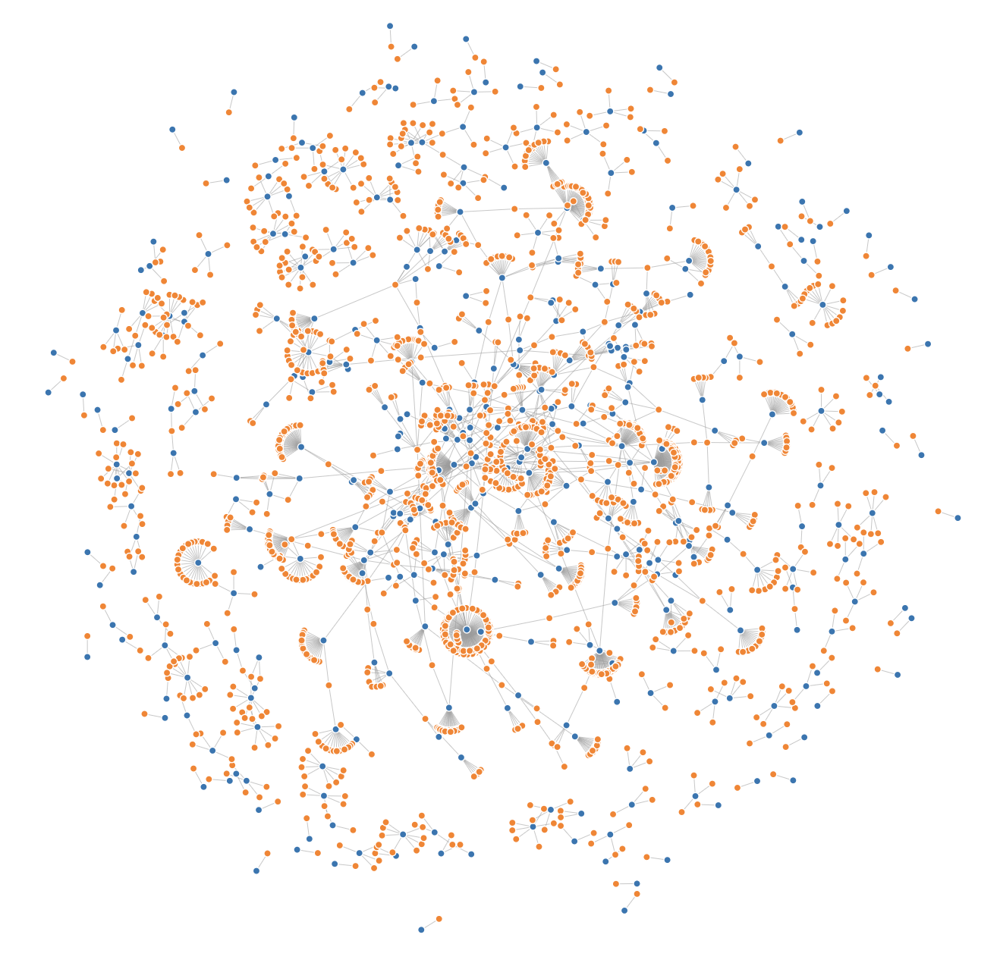

poet之间的合著关系网络

In [89]:
workGroupSQL = '''SELECT workpoetlinks.poetID,workpoetlinks.workID,poet.StartYear 
                FROM workpoetlinks,poet
                WHERE workpoetlinks.poetID = poet.poetID AND role != '作者' AND role!= '主要作者' AND role != '其他作者'
                GROUP BY workpoetlinks.poetID,workpoetlinks.workID ,poet.StartYear 
                ORDER BY workpoetlinks.poetID'''

workgroup = duckdb.query(workGroupSQL).df()
workgroup

,poetID,workID,StartYear
0,5,9,1743
1,6,11,1830
2,12,16,1814
3,16,20,1750
4,28,21,1736
...,...,...,...
2412,8455,473,1740
2413,8456,473,1740
2414,8457,473,1740
2415,8458,473,1740


In [90]:
from itertools import combinations
poet_start_year = workgroup.groupby('poetID')['StartYear'].min().reset_index()
# nodes = [{'id': str(pid), 'group': 1,} for pid in workgroup['poetID'].unique()]
nodes = [{'id': str(row['poetID']), 'group': 1, 'StartYear': str(row['StartYear'])} for _, row in poet_start_year.iterrows()]
nodes

[{'id': '5', 'group': 1, 'StartYear': '1743'},
 {'id': '6', 'group': 1, 'StartYear': '1830'},
 {'id': '12', 'group': 1, 'StartYear': '1814'},
 {'id': '16', 'group': 1, 'StartYear': '1750'},
 {'id': '28', 'group': 1, 'StartYear': '1736'},
 {'id': '32', 'group': 1, 'StartYear': '1821'},
 {'id': '43', 'group': 1, 'StartYear': '1592'},
 {'id': '63', 'group': 1, 'StartYear': '1662'},
 {'id': '72', 'group': 1, 'StartYear': '1728'},
 {'id': '92', 'group': 1, 'StartYear': '1764'},
 {'id': '106', 'group': 1, 'StartYear': '1756'},
 {'id': '108', 'group': 1, 'StartYear': '1766'},
 {'id': '118', 'group': 1, 'StartYear': '1800'},
 {'id': '124', 'group': 1, 'StartYear': '1796'},
 {'id': '126', 'group': 1, 'StartYear': '1797'},
 {'id': '127', 'group': 1, 'StartYear': '1793'},
 {'id': '132', 'group': 1, 'StartYear': '1796'},
 {'id': '145', 'group': 1, 'StartYear': '1800'},
 {'id': '146', 'group': 1, 'StartYear': '1774'},
 {'id': '147', 'group': 1, 'StartYear': '1801'},
 {'id': '154', 'group': 1, 'Star

In [91]:
links = []
for work_id, group in workgroup.groupby('workID'):
    poets = group['poetID'].tolist()
    for (source, target) in combinations(poets, 2):
        links.append({'source': str(source), 'target': str(target), 'value': 1})

network_data = {
    'nodes': nodes,
    'links': links
}

network_data

{'nodes': [{'id': '5', 'group': 1, 'StartYear': '1743'},
  {'id': '6', 'group': 1, 'StartYear': '1830'},
  {'id': '12', 'group': 1, 'StartYear': '1814'},
  {'id': '16', 'group': 1, 'StartYear': '1750'},
  {'id': '28', 'group': 1, 'StartYear': '1736'},
  {'id': '32', 'group': 1, 'StartYear': '1821'},
  {'id': '43', 'group': 1, 'StartYear': '1592'},
  {'id': '63', 'group': 1, 'StartYear': '1662'},
  {'id': '72', 'group': 1, 'StartYear': '1728'},
  {'id': '92', 'group': 1, 'StartYear': '1764'},
  {'id': '106', 'group': 1, 'StartYear': '1756'},
  {'id': '108', 'group': 1, 'StartYear': '1766'},
  {'id': '118', 'group': 1, 'StartYear': '1800'},
  {'id': '124', 'group': 1, 'StartYear': '1796'},
  {'id': '126', 'group': 1, 'StartYear': '1797'},
  {'id': '127', 'group': 1, 'StartYear': '1793'},
  {'id': '132', 'group': 1, 'StartYear': '1796'},
  {'id': '145', 'group': 1, 'StartYear': '1800'},
  {'id': '146', 'group': 1, 'StartYear': '1774'},
  {'id': '147', 'group': 1, 'StartYear': '1801'},
  {

结果：
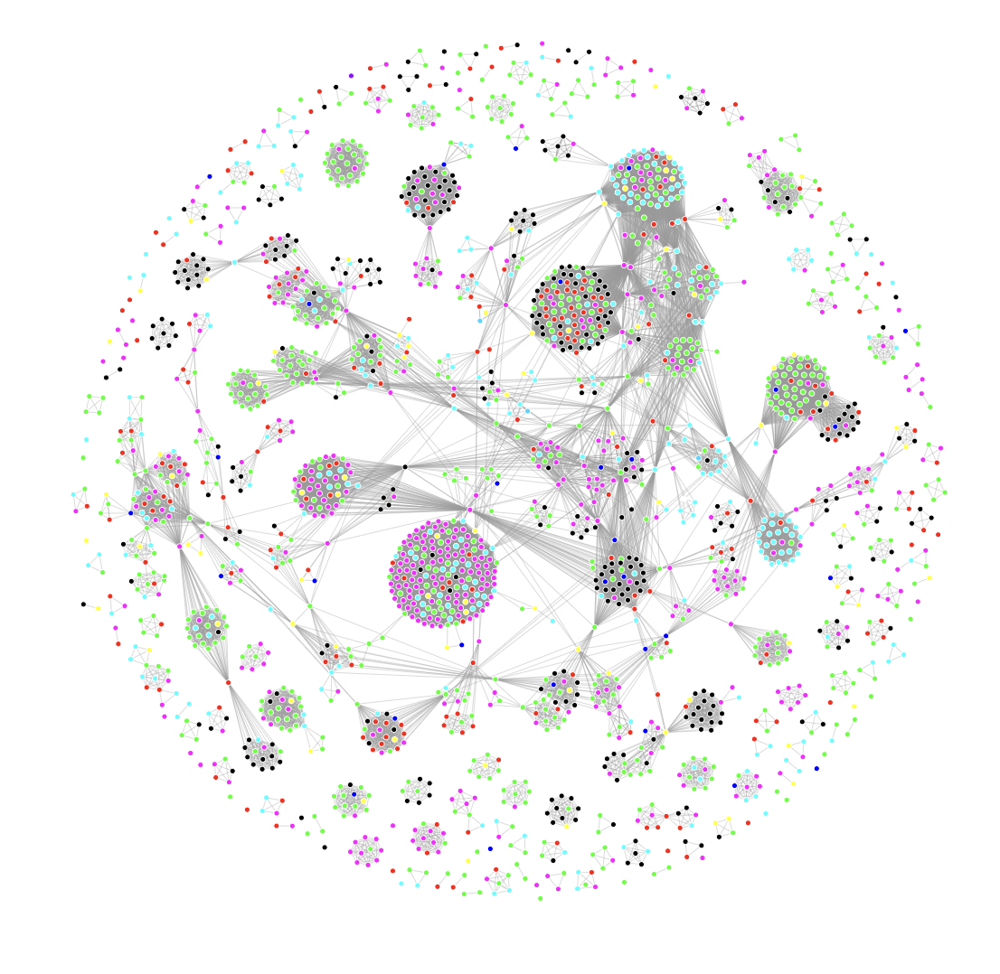

构想：把饼图作为网络图中work的结点，示例（图中饼图为假数据）
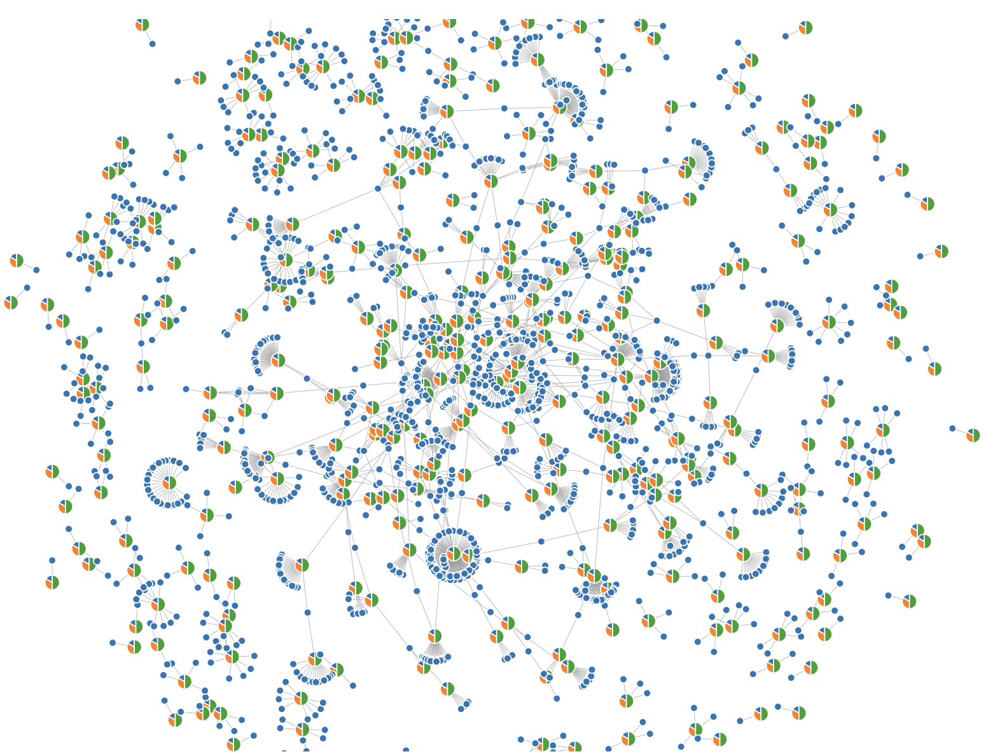

# 一个品被多个集收录？

In [100]:
poemWorkGroupSQL = '''SELECT poemID, COUNT(DISTINCT workID) AS count
    FROM workpoemlinks
    GROUP BY poemID
    ORDER BY count DESC'''

poemWorkGroup = duckdb.query(poemWorkGroupSQL).df()
poemWorkGroup

,poemID,count
0,37,1
1,54,1
2,135,1
3,172,1
4,205,1
...,...,...
91868,96843,1
91869,96935,1
91870,96942,1
91871,97073,1


In [101]:
poetWorkGroupSQL = '''SELECT poetID, COUNT(DISTINCT workID) AS count
    FROM workpoetlinks
    GROUP BY poetID
    ORDER BY count DESC'''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,poetID,count
0,263,13
1,199,9
2,308,9
3,92,7
4,202,7
...,...,...
2765,6143,1
2766,8286,1
2767,8309,1
2768,7437,1


In [21]:
poetWorkGroupSQL = '''SELECT poetID, COUNT(DISTINCT workID) AS count
    FROM workpoetlinks
    WHERE role = '主要作者' OR role = '作者' OR role = '其他作者' 
    GROUP BY poetID
    ORDER BY count DESC'''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,poetID,count
0,202,6
1,165,4
2,213,4
3,106,4
4,199,4
...,...,...
770,116,1
771,691,1
772,1667,1
773,6304,1


In [102]:
poetWorkGroupSQL = '''SELECT poetID, COUNT(DISTINCT workID) AS count
    FROM workpoetlinks
    WHERE role = '像贊作者'
    GROUP BY poetID
    ORDER BY count DESC'''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,poetID,count
0,6430,1
1,6494,1
2,410,1
3,7759,1
4,7006,1
5,6050,1
6,1977,1
7,7279,1


In [20]:
poetWorkGroupSQL = '''SELECT workpoetlinks.poetID,poet.nameHZ, COUNT(DISTINCT workID) AS count
    FROM workpoetlinks,poet
    WHERE (role = '主要作者' OR role ='作者' OR role='其他作者') AND workpoetlinks.poetID = poet.poetID
    GROUP BY workpoetlinks.poetID,poet.nameHZ
    ORDER BY count DESC'''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,poetID,NameHZ,count
0,202,席佩蘭,6
1,911,顧太清,4
2,199,吳藻,4
3,165,王倩,4
4,167,歸懋儀,4
...,...,...,...
770,4104,陳衍,1
771,6041,傅雲龍,1
772,6286,李正,1
773,6459,顧德貞,1


# 判定凡例作者作为编辑作者
除了作者6765只做为对应作品的凡例作者，其余凡例作者都在作品中同时担任编辑、序作者等角色

In [112]:
poetWorkGroupSQL = '''SELECT w.workID, w.poetID, w.role
FROM workpoetlinks w
JOIN (
    SELECT poetID, workID
    FROM workpoetlinks
    WHERE role = '凡例作者'
) AS subquery
ON w.poetID = subquery.poetID AND w.workID = subquery.workID
ORDER BY w.workID
    '''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,workID,poetID,role
0,17,474,编輯
1,17,474,序作者
2,17,474,凡例作者
3,18,480,编輯
4,18,480,序作者
5,18,480,凡例作者
6,19,268,编輯
7,19,268,凡例作者
8,38,274,编輯
9,38,274,序作者


In [113]:
poetWorkGroupSQL = '''SELECT w.workID, w.poetID, w.role
FROM workpoetlinks w
JOIN (
    SELECT poetID, workID
    FROM workpoetlinks
    WHERE role = '年譜作者'
) AS subquery
ON w.poetID = subquery.poetID AND w.workID = subquery.workID
ORDER BY w.workID
'''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,workID,poetID,role
0,40,308,年譜作者
1,58,431,年譜作者
2,58,432,年譜作者
3,58,433,年譜作者


# 輓詞作者

In [121]:
poetWorkGroupSQL = '''SELECT w.workID, w.poetID, w.role
FROM workpoetlinks w
JOIN (
    SELECT poetID, workID
    FROM workpoetlinks
    WHERE role = '輓詞作者'
) AS subquery
ON w.poetID = subquery.poetID AND w.workID = subquery.workID
WHERE role != '輓詞作者'
ORDER BY w.workID
'''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,workID,poetID,role
0,105,4737,題辭
1,105,4737,附記作者
2,125,5637,跋作者
3,125,5650,題辭
4,125,5692,題辭
5,125,5735,題辭
6,125,5756,題辭
7,148,6030,序作者
8,148,6030,題辭
9,148,6030,作者


# 傳記作者可能是编辑作者也可能是收录作者
如果一个人在这个作品里，除了是傳記作者还是作者，就判定这个人是收录作者
如果如果一个人在这个作品里，除了是傳記作者还是序作者、跋作者或者附记作者，就判定这个人是收录作者

In [13]:
poetWorkGroupSQL = '''SELECT w.workID, w.poetID, w.role
FROM workpoetlinks w
JOIN (
    SELECT poetID, workID
    FROM workpoetlinks
    WHERE role = '傳記作者'
) AS subquery
ON w.poetID = subquery.poetID AND w.workID = subquery.workID
WHERE w.role != '傳記作者'
ORDER BY w.workID
'''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,workID,poetID,role
0,34,263,跋作者
1,58,430,序作者
2,67,430,序作者
3,67,430,附記作者
4,76,4600,跋作者
5,123,7155,序作者
6,126,4104,作者
7,162,6085,附記作者
8,165,6065,作者
9,177,6342,作者


# 划分编辑作者和收录作者
收录作者：主要作者、作者、其他作者、墓志铭作者、挽词作者、像贊作者
编辑作者：序作者、跋作者、编辑、凡例作者、校阅、校註者、附記作者


role	count
0	编輯	45
1	主要作者	413
2	墓志詺作者	24
3	校閲	12
4	None	4
5	作者	451
6	像贊作者	8
7	題辭	1230
8	序作者	758
9	輓詞作者	94
10	校註者	3
11	附記作者	22
12	凡例作者	7
13	其他作者	44
14	跋作者	214
15	年譜作者	4
16	傳記作者	113


# 集的种类

In [60]:
worktypeSQL='''
SELECT worktype, COUNT(*) AS count
    FROM work
    GROUP BY work.worktype
    ORDER BY worktype
'''
worktype = duckdb.query(worktypeSQL).df()
worktype

,worktype,count
0,傳,2
1,別集,378
2,合刻,11
3,彈詞,7
4,總集,25
5,詩話,8


# 查询只有主要作者的work

In [25]:
workmainpoetonlySQL = '''
SELECT workID
FROM workpoetlinks
GROUP BY workID
HAVING COUNT(DISTINCT role) = 1 AND MAX(role) = '主要作者';
'''
workmainpoetonly = duckdb.query(workmainpoetonlySQL).df()
workmainpoetonly

,workID
0,214
1,221
2,247
3,252
4,260
5,300
6,399
7,193
8,203
9,232


# 类型为“别集”的work的作者？

In [30]:
biejiauthorSQL = '''
SELECT workpoetlinks.workID,workpoetlinks.poetID,workpoetlinks.role
FROM workpoetlinks,work
WHERE work.workID = workpoetlinks.workID AND work.worktype = '別集'
GROUP BY workpoetlinks.workID,workpoetlinks.poetID,workpoetlinks.role
ORDER BY workpoetlinks.workID
'''
biejiauthor = duckdb.query(biejiauthorSQL).df()
biejiauthor

,workID,poetID,role
0,9,1951,墓志詺作者
1,9,1968,序作者
2,9,328,跋作者
3,9,328,校閲
4,9,5,序作者
...,...,...,...
3025,480,7051,序作者
3026,482,456,附記作者
3027,482,911,主要作者
3028,482,456,序作者


# 在一本别集中只担任主要作者角色不担任其他角色的poet

In [31]:
biejiauthorSQL = '''
SELECT wpl.workID, wpl.poetID, wpl.role
FROM workpoetlinks wpl
JOIN work w ON w.workID = wpl.workID
WHERE w.worktype = '別集'
AND wpl.role = '主要作者'
AND NOT EXISTS (
    SELECT 1
    FROM workpoetlinks other
    WHERE other.workID = wpl.workID
    AND other.poetID = wpl.poetID
    AND other.role != '主要作者'
)
GROUP BY wpl.workID, wpl.poetID, wpl.role
ORDER BY wpl.workID;
'''
biejiauthor = duckdb.query(biejiauthorSQL).df()
biejiauthor

,workID,poetID,role
0,12,238,主要作者
1,13,8,主要作者
2,14,167,主要作者
3,15,11,主要作者
4,22,29,主要作者
...,...,...,...
352,476,7855,主要作者
353,477,5942,主要作者
354,478,7858,主要作者
355,480,7851,主要作者


In [47]:
# poet238在其他作品中担任有其他角色
biejiauthorSQL = '''
SELECT wpl.workID, wpl.poetID, wpl.role
FROM workpoetlinks wpl
WHERE wpl.poetID = '238'
'''
biejiauthor = duckdb.query(biejiauthorSQL).df()
biejiauthor

,workID,poetID,role
0,12,238,主要作者
1,61,238,作者


# 在整个表中的所有集中，只担任‘主要作者’role的poet

In [35]:
poetonlySQL = '''
SELECT workID,poetID
FROM workpoetlinks
GROUP BY poetID,workID
HAVING COUNT(DISTINCT role) = 1 AND MAX(role) = '主要作者';;
'''
poetonly = duckdb.query(poetonlySQL).df()
poetonly

,workID,poetID
0,22,30
1,24,275
2,33,38
3,46,210
4,49,145
...,...,...
383,423,1933
384,423,1934
385,450,247
386,454,3695


# 别集的‘作者’可能有多个

In [36]:
biejiauthorSQL = '''
SELECT workpoetlinks.workID,workpoetlinks.poetID,workpoetlinks.role
FROM workpoetlinks,work
WHERE work.workID = workpoetlinks.workID AND work.worktype = '別集' AND workpoetlinks.role = '作者'
GROUP BY workpoetlinks.workID,workpoetlinks.poetID,workpoetlinks.role
ORDER BY workpoetlinks.workID
'''
biejiauthor = duckdb.query(biejiauthorSQL).df()
biejiauthor

,workID,poetID,role
0,22,1980,作者
1,22,438,作者
2,22,2018,作者
3,51,3221,作者
4,51,244,作者
...,...,...,...
214,469,7861,作者
215,476,7857,作者
216,476,435,作者
217,476,7856,作者


# 别集的‘主要作者’也可能有多个

In [43]:
testbiejiauthorSQL = '''
SELECT workpoetlinks.workID,workpoetlinks.poetID,workpoetlinks.role
FROM workpoetlinks,work
WHERE work.workID = '22' AND workpoetlinks.workID = '22' AND work.worktype = '別集'
GROUP BY workpoetlinks.workID,workpoetlinks.poetID,workpoetlinks.role
ORDER BY workpoetlinks.workID
'''
testbiejiauthor = duckdb.query(testbiejiauthorSQL).df()
testbiejiauthor

,workID,poetID,role
0,22,440,題辭
1,22,438,題辭
2,22,1980,作者
3,22,29,主要作者
4,22,2018,作者
5,22,438,作者
6,22,30,主要作者


In [46]:
testbiejiauthorSQL = '''
SELECT workpoetlinks.workID,work.titleHZ,workpoetlinks.poetID,poet.nameHZ,workpoetlinks.role
FROM workpoetlinks,work,poet
WHERE work.workID = '22' AND workpoetlinks.workID = '22' AND work.worktype = '別集' AND workpoetlinks.poetID = poet.poetID
GROUP BY workpoetlinks.workID,workpoetlinks.poetID,workpoetlinks.role,work.titleHZ,poet.nameHZ
ORDER BY workpoetlinks.workID
'''
testbiejiauthor = duckdb.query(testbiejiauthorSQL).df()
testbiejiauthor

,workID,TitleHZ,poetID,NameHZ,role
0,22,南湘室詩草﹕一卷﹐詩餘﹕一卷(姚倩、姚茞撰),29,姚倩,主要作者
1,22,南湘室詩草﹕一卷﹐詩餘﹕一卷(姚倩、姚茞撰),440,朱紈,題辭
2,22,南湘室詩草﹕一卷﹐詩餘﹕一卷(姚倩、姚茞撰),2018,姚鴻慧,作者
3,22,南湘室詩草﹕一卷﹐詩餘﹕一卷(姚倩、姚茞撰),438,林鵾翔,作者
4,22,南湘室詩草﹕一卷﹐詩餘﹕一卷(姚倩、姚茞撰),1980,姚志鳳,作者
5,22,南湘室詩草﹕一卷﹐詩餘﹕一卷(姚倩、姚茞撰),30,姚茝,主要作者
6,22,南湘室詩草﹕一卷﹐詩餘﹕一卷(姚倩、姚茞撰),438,林鵾翔,題辭


In [54]:
testbiejiauthorSQL = '''
SELECT poet.nameHZ,COUNT(poempoetlinks.poemID)
FROM workpoemlinks,poempoetlinks,poet
WHERE workpoemlinks.workID = '22' AND workpoemlinks.poemID = poempoetlinks.poemID AND poempoetlinks.poetID = poet.poetID
GROUP BY poet.poetID,poet.nameHZ
'''
testbiejiauthor = duckdb.query(testbiejiauthorSQL).df()
testbiejiauthor

,NameHZ,count(poempoetlinks.poemID)
0,姚茝,71
1,姚倩,103
2,林鵾翔,2
3,朱紈,2
4,姚志鳳,1
5,姚鴻慧,1


In [84]:
hekeSQL = '''
SELECT workpoetlinks.workID,workpoetlinks.poetID,workpoetlinks.role
FROM workpoetlinks,work
WHERE work.worktype='合刻' AND work.workID = workpoetlinks.workID
ORDER BY workpoetlinks.workID
'''
heke = duckdb.query(hekeSQL).df()
heke

,workID,poetID,role
0,20,469,序作者
1,20,16,序作者
2,20,13,作者
3,20,14,作者
4,20,15,作者
...,...,...,...
144,479,8125,作者
145,479,8123,跋作者
146,479,8111,作者
147,479,8126,作者


In [96]:
muzhimingSQL = '''
SELECT w1.workID, w1.poetID,w1.role
FROM workpoetlinks w1
WHERE EXISTS (
    SELECT 1
    FROM workpoetlinks w2
    WHERE (w2.role = '墓志詺作者' OR w2.role = '輓詞作者')
      AND w1.workID = w2.workID
)
ORDER BY w1.workID;
'''
muzhiming = duckdb.query(muzhimingSQL).df()
muzhiming

,workID,poetID,role
0,9,5,主要作者
1,9,486,序作者
2,9,1968,序作者
3,9,328,校閲
4,9,328,跋作者
...,...,...,...
652,454,7819,題辭
653,454,7822,題辭
654,454,3682,題辭
655,454,7823,題辭


# 集的题辞数量

In [64]:
ticiSQL = '''
SELECT workID,COUNT(poetID) as count
FROM workpoetlinks
WHERE role = '題辭'
GROUP BY workID
ORDER BY count DESC
'''
tici = duckdb.query(ticiSQL).df()
tici

,workID,count
0,125,119
1,223,96
2,218,73
3,352,49
4,112,43
...,...,...
145,50,1
146,192,1
147,239,1
148,466,1


In [66]:
tici.describe()

,workID,count
count,150.000000,150.000000
mean,256.086667,8.200000
std,138.291344,15.231106
min,10.000000,1.000000
25%,141.250000,1.000000
50%,264.500000,3.000000
75%,373.250000,8.000000
max,482.000000,119.000000


In [71]:
tici['count'].value_counts(sort=True, ascending=False)

count
1      47
2      18
3      17
4      12
6       8
9       4
11      4
7       4
8       4
5       3
24      3
21      3
19      3
14      3
23      2
18      2
13      2
119     1
12      1
96      1
16      1
20      1
27      1
33      1
43      1
49      1
73      1
15      1
Name: count, dtype: int64

In [72]:
poem['changheshuxinpoetID'].value_counts(sort=True, ascending=False)

changheshuxinpoetID
0       87707
244        98
7909       80
167        75
7860       69
        ...  
4547        1
618         1
3378        1
6265        1
4747        1
Name: count, Length: 875, dtype: int64

In [123]:
newtable = poem[poem['GenreHZ'] != '文﹕書信']
newtable

,poemID,poetassubjectID,changheshuxinpoetID,tempID,TitleHZ,TitlePY,GenreHZ,GenrePY,Form,TunePatternSubtitle,TunePatternSubtitlePY,Refs,Notes
0,7011,2067,0,0,杜羔妻趙氏[插圖],Du Gao qi Zhao shi [cha tu],圖,tu,NaN,NaN,NaN,NaN,NaN
1,7010,0,0,0,卷三封面,Juan san feng mian,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7009,0,0,0,蘭閨寶錄卷三目錄,Lan gui bao lu juan san mu lu,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,7,0,0,0,題自畫牡丹,Ti zi hua mu dan,詩,shi,七言絕句,NaN,NaN,NaN,NaN
4,6,0,0,0,池上夜坐,Chi shang ye zuo,詩,shi,五言律詩,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
92089,97303,0,0,0,對月,Dui yue,詩,shi,五言絕句,NaN,NaN,NaN,NaN
92090,97304,0,0,0,註釋,Zhu shi,文﹕案語,Wen: An yu,NaN,NaN,NaN,NaN,NaN
92091,97305,0,0,0,版權頁,Ban quan ye,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92092,97306,0,0,0,空白頁,Kong bai ye,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
poem['changheshuxinpoetID'].value_counts(sort=True, ascending=False).describe()

count      875.000000
mean       105.250286
std       2964.880551
min          1.000000
25%          1.000000
50%          2.000000
75%          5.000000
max      87707.000000
Name: count, dtype: float64

In [75]:
poem['poetassubjectID'].value_counts(sort=True, ascending=False)

poetassubjectID
0       83269
1917       78
99         68
207        67
225        63
        ...  
3208        1
3209        1
3210        1
3212        1
4703        1
Name: count, Length: 4651, dtype: int64

# 题辞的作者分布
在总共的431部集中，有题辞的集有150部，共有1230个题辞记录，题辞最多的诗人有题辞过4次

In [100]:
ticiauthorSQL = '''
SELECT workID,poetID
FROM workpoetlinks
WHERE role = '題辭'
'''
ticiauthor = duckdb.query(ticiauthorSQL).df()
ticiauthor

,workID,poetID
0,15,360
1,57,3799
2,47,3553
3,16,239
4,16,370
...,...,...
1225,473,8455
1226,473,8456
1227,473,8457
1228,473,8458


In [101]:
ticiauthor['poetID'].value_counts(sort=True,ascending=False)

poetID
199     4
434     4
3797    3
3799    3
6474    3
       ..
7697    1
7698    1
7770    1
7774    1
8459    1
Name: count, Length: 1166, dtype: int64

# 唱和诗

In [131]:
changheshiSQL = '''
SELECT poemID,changheshuxinpoetID
FROM poem
WHERE GenreHZ != '文﹕書信' OR GenreHZ IS NULL
'''
changheshi = duckdb.query(changheshiSQL).df()
changheshi

,poemID,changheshuxinpoetID
0,7011,0
1,7010,0
2,7009,0
3,7,0
4,6,0
...,...,...
91387,97233,0
91388,97234,0
91389,97305,0
91390,97306,0


In [132]:
changheshi['changheshuxinpoetID'].value_counts(sort=True,ascending=False)

changheshuxinpoetID
0       87075
244        98
7909       80
167        75
7860       69
        ...  
6038        1
1002        1
618         1
6427        1
2676        1
Name: count, Length: 870, dtype: int64

In [149]:
test244SQL = '''
SELECT poemID,TitleHZ
FROM poem
WHERE changheshuxinpoetID = 244
ORDER BY poemID DESC
'''
test244 = duckdb.query(test244SQL).df()
test244

,poemID,TitleHZ
0,34411,題琴河女史屈宛仙秉筠畫白蓮
1,28213,菩薩蠻
2,28208,被花惱
3,28205,天仙子
4,28177,哭屈宛仙
...,...,...
93,10335,促宛仙作九九消寒詩
94,10332,謝屈宛仙惠題小影即次原韻
95,9731,菩薩蠻
96,9726,被花惱


# 集Importance:题辞数、序数和跋数

In [6]:
xuSQL = '''
SELECT workID,count(*) as xucount
FROM workpoetlinks 
WHERE role IN ('序作者')
Group By workID
ORDER BY xucount DESC
'''
xu = duckdb.query(xuSQL).df()
xu

,workID,xucount
0,158,17
1,167,14
2,118,9
3,57,9
4,283,8
...,...,...
316,470,1
317,124,1
318,130,1
319,190,1


In [7]:
baSQL = '''
SELECT workID,count(*) as bacount
FROM workpoetlinks 
WHERE role IN ('跋作者')
Group By workID
ORDER BY bacount DESC
'''
ba = duckdb.query(baSQL).df()
ba

,workID,bacount
0,186,5
1,15,4
2,204,4
3,50,3
4,246,3
...,...,...
151,475,1
152,395,1
153,320,1
154,156,1


In [8]:
ticiSQL = '''
SELECT workID,count(*) as ticicount
FROM workpoetlinks 
WHERE role IN ('題辭')
Group By workID
ORDER BY ticicount DESC
'''
tici = duckdb.query(ticiSQL).df()
tici

,workID,ticicount
0,125,119
1,223,96
2,218,73
3,352,49
4,112,43
...,...,...
145,154,1
146,287,1
147,341,1
148,409,1


In [9]:
jiimportanceSQL = '''
SELECT workID,count(*) as ticicount
FROM workpoetlinks 
WHERE role IN ('序作者','跋作者','題辭')
Group By workID
ORDER BY ticicount DESC
'''
jiimportance = duckdb.query(jiimportanceSQL).df()
jiimportance

,workID,ticicount
0,125,123
1,223,100
2,218,74
3,352,56
4,112,51
...,...,...
358,345,1
359,295,1
360,45,1
361,437,1


In [10]:
jiimportance['ticicount'].value_counts(sort=True,ascending=False)

ticicount
1      92
2      67
4      44
3      41
5      23
8      15
6      14
7      10
9       8
15      5
11      5
10      4
23      4
20      4
14      4
13      3
17      3
25      3
100     1
18      1
21      1
12      1
24      1
26      1
32      1
34      1
40      1
42      1
51      1
56      1
74      1
123     1
Name: count, dtype: int64

In [11]:
testwork125SQL = '''
SELECT workID,poetID,role
FROM workpoetlinks
WHERE role IN ('序作者','跋作者','題辭') AND workID = 125
'''
testwork125 = duckdb.query(testwork125SQL).df()
testwork125

,workID,poetID,role
0,125,5638,序作者
1,125,5639,序作者
2,125,5637,跋作者
3,125,5640,跋作者
4,125,5643,題辭
...,...,...,...
118,125,5754,題辭
119,125,5755,題辭
120,125,5756,題辭
121,125,8308,題辭


In [12]:
ji = pd.concat([xu, ba, tici], ignore_index=True)
ji=ji.fillna(0)
ji

,workID,xucount,bacount,ticicount
0,158,17.0,0.0,0.0
1,167,14.0,0.0,0.0
2,118,9.0,0.0,0.0
3,57,9.0,0.0,0.0
4,283,8.0,0.0,0.0
...,...,...,...,...
622,154,0.0,0.0,1.0
623,287,0.0,0.0,1.0
624,341,0.0,0.0,1.0
625,409,0.0,0.0,1.0


In [13]:
xuweight = 1
baweight = 1
ticiweight = 1

In [14]:
ji['totalweight'] = xuweight*ji['xucount'] + baweight*ji['bacount'] + ticiweight*ji['ticicount']
ji

,workID,xucount,bacount,ticicount,totalweight
0,158,17.0,0.0,0.0,17.0
1,167,14.0,0.0,0.0,14.0
2,118,9.0,0.0,0.0,9.0
3,57,9.0,0.0,0.0,9.0
4,283,8.0,0.0,0.0,8.0
...,...,...,...,...,...
622,154,0.0,0.0,1.0,1.0
623,287,0.0,0.0,1.0,1.0
624,341,0.0,0.0,1.0,1.0
625,409,0.0,0.0,1.0,1.0


# 作者Importance

## 被收录（是否排除参与编辑）的次数

In [15]:
# 只算作者、主要作者和其他作者
poetWorkGroupSQL = '''SELECT workpoetlinks.poetID,poet.nameHZ, COUNT(DISTINCT workID) AS participate_count
    FROM workpoetlinks,poet
    WHERE role in ('作者','主要作者','其他作者') AND workpoetlinks.poetID = poet.poetID
    GROUP BY workpoetlinks.poetID,poet.nameHZ
    ORDER BY participate_count DESC'''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,poetID,NameHZ,participate_count
0,202,席佩蘭,6
1,199,吳藻,4
2,165,王倩,4
3,213,熊璉,4
4,106,駱綺蘭,4
...,...,...,...
770,4104,陳衍,1
771,6041,傅雲龍,1
772,6286,李正,1
773,6459,顧德貞,1


In [16]:
poetWorkGroup['participate_count'].value_counts(sort=True,ascending=False)

participate_count
1    678
2     73
3     16
4      7
6      1
Name: count, dtype: int64

In [17]:
# 只要参与集的组成都算
poetWorkGroupAllSQL = '''SELECT workpoetlinks.poetID,poet.nameHZ, COUNT(DISTINCT workID) AS participate_count
    FROM workpoetlinks,poet
    WHERE workpoetlinks.poetID = poet.poetID
    GROUP BY workpoetlinks.poetID,poet.nameHZ
    ORDER BY participate_count DESC'''

poetWorkGroupAll = duckdb.query(poetWorkGroupAllSQL).df()
poetWorkGroupAll

,poetID,NameHZ,participate_count
0,263,袁枚,13
1,308,俞樾,9
2,199,吳藻,9
3,92,潘素心,7
4,4636,張曜孫,7
...,...,...,...
2765,7281,周保極,1
2766,7433,姚壽慈,1
2767,8115,劉蕙英,1
2768,8433,倫明,1


In [18]:
participate = poetWorkGroupAll[['poetID','participate_count']]
participate

,poetID,participate_count
0,263,13
1,308,9
2,199,9
3,92,7
4,4636,7
...,...,...
2765,7281,1
2766,7433,1
2767,8115,1
2768,8433,1


In [19]:
poetWorkGroupAll['participate_count'].value_counts(sort=True,ascending=False)

participate_count
1     2464
2      212
3       63
4       16
5        6
7        4
9        2
6        2
13       1
Name: count, dtype: int64

# 写像赞的次数

In [20]:
# 从品的类型角度统计
xiangzanauthorSQL = '''
SELECT poem.poemID,poet.poetID,workpoetlinks.workID,workpoetlinks.role
FROM poet, poem,poempoetlinks,workpoetlinks
WHERE poem.GenreHZ='文﹕像贊' AND poem.poemID = poempoetlinks.poemID AND poempoetlinks.poetID  = poet.poetID AND workpoetlinks.poetID = poet.poetID
'''
xiangzanauthor = duckdb.query(xiangzanauthorSQL).df()
xiangzanauthor

,poemID,poetID,workID,role
0,4283,1977,9,像贊作者
1,29812,1664,68,主要作者
2,29813,1664,68,主要作者
3,29815,1664,68,主要作者
4,38420,225,112,主要作者
5,54304,6430,171,像贊作者
6,60789,6494,223,像贊作者
7,69259,7006,301,像贊作者
8,87899,42,37,作者
9,90162,42,37,作者


In [21]:
writeXZ = xiangzanauthor['poetID'].value_counts(sort=True,ascending=False).reset_index()
writeXZ = writeXZ.rename(columns={'count':'writeXZ'})
writeXZ

,poetID,writeXZ
0,1664,10
1,42,6
2,195,4
3,4424,3
4,225,2
5,6430,2
6,244,2
7,1977,1
8,6494,1
9,7006,1


In [163]:
# 从作者role角度统计
poetWorkGroupSQL = '''SELECT poetID,workID
    FROM workpoetlinks
    WHERE role = '像贊作者'
    ORDER BY poetID'''

poetWorkGroup = duckdb.query(poetWorkGroupSQL).df()
poetWorkGroup

,poetID,workID
0,410,250
1,1977,9
2,6050,417
3,6430,171
4,6494,223
5,7006,301
6,7279,368
7,7759,458


### 两个角度对不上，以作品角度为准

## 被写像赞的次数

In [22]:
bexiangzanSQL = '''
SELECT poem.poemID,poem.poetassubjectID,poempoetlinks.poetID
FROM poem,poempoetlinks
WHERE poem.GenreHZ='文﹕像贊' AND poem.poemID = poempoetlinks.poemID AND poetassubjectID !=0
'''
bexiangzan = duckdb.query(bexiangzanSQL).df()
bexiangzan

,poemID,poetassubjectID,poetID
0,4283,5,1977
1,38420,4939,225


In [23]:
inXZ = bexiangzan['poetassubjectID'].value_counts(sort=True,ascending=False).reset_index()
inXZ = inXZ.rename(columns={'poetassubjectID': 'poetID','count':'inXZ'})
inXZ

,poetID,inXZ
0,5,1
1,4939,1


### 只知道有两个人被写过像赞……

## 被讨论的次数poetassubjectID 去除像赞

In [24]:
discussedSQL = '''
SELECT poem.poemID,poem.poetassubjectID,poempoetlinks.poetID
FROM poem,poempoetlinks
WHERE poem.GenreHZ!='文﹕像贊' AND poem.poemID =poempoetlinks.poemID AND poem.poetassubjectID != 0
'''
discussed = duckdb.query(discussedSQL).df()
discussed

,poemID,poetassubjectID,poetID
0,6951,2055,480
1,4253,238,413
2,4256,5,1957
3,4257,5,1958
4,4258,5,1960
...,...,...,...
8922,92820,4708,7842
8923,92821,4703,7842
8924,95118,911,4673
8925,95119,911,456


In [25]:
bediscussed = discussed['poetassubjectID'].value_counts(sort=True,ascending=False).reset_index()
bediscussed = bediscussed.rename(columns={'poetassubjectID':'poetID','count':'bediscussed'})
bediscussed

,poetID,bediscussed
0,1917,79
1,207,69
2,99,68
3,225,60
4,911,57
...,...,...
4641,3564,1
4642,4046,1
4643,4045,1
4644,4048,1


In [26]:
discussed['poetID'].value_counts(sort=True,ascending=False)

poetID
274     2045
429     1409
685      942
306      519
268      478
        ... 
445        1
4633       1
4630       1
444        1
4682       1
Name: count, Length: 614, dtype: int64

### poet274讨论别人很多次（2045），自己也收到了45次讨论，社交达人？

## 收到唱和诗的次数（排除书信）

In [27]:
changheshiSQL = '''
SELECT poem.poemID,poem.changheshuxinpoetID,poempoetlinks.poetID
FROM poem,poempoetlinks
WHERE (GenreHZ != '文﹕書信' OR GenreHZ IS NULL) AND poem.poemID =poempoetlinks.poemID AND changheshuxinpoetID !=0
'''
changheshi = duckdb.query(changheshiSQL).df()
changheshi

,poemID,changheshuxinpoetID,poetID
0,37,3830,510
1,57,979,527
2,66,48,528
3,69,48,528
4,74,655,48
...,...,...,...
4301,88369,3139,7540
4302,88370,3139,7540
4303,88371,8394,7540
4304,88361,3139,7540


In [28]:
changhe = changheshi['changheshuxinpoetID'].value_counts(sort=True,ascending=False).reset_index()
changhe = changhe.rename(columns={'changheshuxinpoetID':'poetID','count':'changhe'})
changhe

,poetID,changhe
0,244,98
1,7909,80
2,167,75
3,221,60
4,7860,57
...,...,...
862,2104,1
863,979,1
864,4938,1
865,4714,1


In [29]:

changheshi['poetID'].value_counts(sort=True, ascending=False).reset_index()

,poetID,count
0,4258,217
1,202,216
2,99,163
3,911,133
4,127,130
...,...,...
601,1895,1
602,4446,1
603,137,1
604,136,1


In [30]:
poetImportance = pd.concat([participate,writeXZ,inXZ,bediscussed,changhe],ignore_index=True)
poetImportance = poetImportance.fillna(0)
poetImportance

,poetID,participate_count,writeXZ,inXZ,bediscussed,changhe
0,263,13.0,0.0,0.0,0.0,0.0
1,308,9.0,0.0,0.0,0.0,0.0
2,199,9.0,0.0,0.0,0.0,0.0
3,92,7.0,0.0,0.0,0.0,0.0
4,4636,7.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
8292,2104,0.0,0.0,0.0,0.0,1.0
8293,979,0.0,0.0,0.0,0.0,1.0
8294,4938,0.0,0.0,0.0,0.0,1.0
8295,4714,0.0,0.0,0.0,0.0,1.0


In [54]:
participateWeight = 1
writeXZWeight = 1
inXZWeight = 1
bediscussedWeight = 1
changheWeight = 0.5

In [55]:
poetImportance['totalWeight'] = participateWeight*poetImportance['participate_count'] + writeXZWeight*poetImportance['writeXZ']+inXZWeight*poetImportance['inXZ']+bediscussedWeight*poetImportance['bediscussed']+changheWeight*poetImportance['changhe']
poetImportance.reset_index()

,index,poetID,participate_count,writeXZ,inXZ,bediscussed,changhe,totalWeight
0,0,263,13.0,0.0,0.0,0.0,0.0,13.0
1,1,308,9.0,0.0,0.0,0.0,0.0,9.0
2,2,199,9.0,0.0,0.0,0.0,0.0,9.0
3,3,92,7.0,0.0,0.0,0.0,0.0,7.0
4,4,4636,7.0,0.0,0.0,0.0,0.0,7.0
...,...,...,...,...,...,...,...,...
8292,8292,2104,0.0,0.0,0.0,0.0,1.0,0.5
8293,8293,979,0.0,0.0,0.0,0.0,1.0,0.5
8294,8294,4938,0.0,0.0,0.0,0.0,1.0,0.5
8295,8295,4714,0.0,0.0,0.0,0.0,1.0,0.5


In [56]:
poetImportance['totalWeight'].value_counts(sort=True,ascending=True).reset_index().sort_values(by='totalWeight', ascending=False)

,totalWeight,count
25,79.0,1
26,69.0,1
27,68.0,1
15,60.0,1
20,57.0,1
2,49.0,1
14,45.0,1
12,43.0,1
5,40.0,1
11,39.0,1


In [57]:
xuweight = 1
baweight = 1
ticiweight = 1
ji['totalweight'] = xuweight * ji['xucount'] + baweight * ji['bacount'] + ticiweight * ji['ticicount']
ji

,workID,xucount,bacount,ticicount,totalweight
0,158,17.0,0.0,0.0,17.0
1,167,14.0,0.0,0.0,14.0
2,118,9.0,0.0,0.0,9.0
3,57,9.0,0.0,0.0,9.0
4,283,8.0,0.0,0.0,8.0
...,...,...,...,...,...
622,154,0.0,0.0,1.0,1.0
623,287,0.0,0.0,1.0,1.0
624,341,0.0,0.0,1.0,1.0
625,409,0.0,0.0,1.0,1.0


In [58]:
ji['totalweight'].value_counts(sort=True,ascending=True).reset_index().sort_values(by='totalweight', ascending=False)

,totalweight,count
10,119.0,1
9,96.0,1
8,73.0,1
11,49.0,1
6,43.0,1
5,33.0,1
4,27.0,1
17,24.0,3
14,23.0,2
15,21.0,3


In [59]:
ji_aggregated = ji.groupby('totalweight')['workID'].apply(list).reset_index()
fig = px.bar(ji_aggregated, x='totalweight', y=ji_aggregated['workID'].str.len(),
             text=ji_aggregated['workID'].str.len(),
             hover_data={'ID': ji_aggregated['workID'].apply(lambda x: ', '.join(map(str, x)))})
# 更新布局以添加标题和调整工具提示显示
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(title_text='Distribution of Total Values with IDs on Hover',
                  xaxis_title="Total Value",
                  yaxis_title="Frequency",
                  hovermode="x unified")
fig.show()

In [37]:
import dash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output
import requests

In [68]:
app = dash.Dash(__name__,suppress_callback_exceptions=True)

app.layout = html.Div([
    html.Div([
        dcc.Graph(id='work-distribution-chart', style={'height': '45vh', 'width': '100vw'}),
        html.Div(id='work-name-output')
    ], style={'height': '50vh'}),
    html.Div([
        dcc.Graph(id='poet-distribution-chart', style={'height': '45vh', 'width': '100vw'}),
        html.Div(id='poet-info-output')
    ], style={'height': '50vh'})
])

jidata = ji['totalweight'].value_counts(sort=True,ascending=True).reset_index().sort_values(by='totalweight', ascending=False)
poetdata = poetImportance['totalWeight'].value_counts(sort=True,ascending=True).reset_index().sort_values(by='totalWeight', ascending=False)

def normalize_data_to_100(series):
    return (series - series.min()) / (series.max() - series.min()) * 100


# API 调用函数
def fetch_work_from_api(id):
    response = requests.get(f"http://localhost:8000/work/{id}")
    print(response)
    if response.status_code == 200 and len(response.json())>0:
        return str(response.json()[0]['TitleHZ'])
    else:
        return f"Work{id} not found"
    
def fetch_poet_from_api(id):
    response = requests.get(f"http://localhost:8000/poet/{id}")
    print(response)
    if response.status_code == 200 and len(response.json())>0:
        return str(response.json()[0]['NameHZ'])
    else:
        return f"Poet{id} not found"

# 更新显示的数据
@app.callback(
    Output('work-distribution-chart', 'figure'),
    Output('work-name-output', 'children'),
    Input('work-distribution-chart', 'hoverData')
)
def update_graph_and_display_name(hoverData):
    # 绘制 Total 值的分布
    fig = px.bar(jidata, x='totalweight', y='count', text='count', title="Distribution of work Total Values")
    work_name = "Hover over a bar to see the work's name."
    if hoverData:
        total_value = int(hoverData['points'][0]['x'])
        ids = ji[ji['totalweight'] == total_value]['workID'].tolist()
        work_names = ", ".join([fetch_work_from_api(id) for id in ids])
        
        work_name = f"work for Total {total_value}: {work_names}"
    return fig, work_name

@app.callback(
    Output('poet-distribution-chart', 'figure'),
    Output('poet-info-output', 'children'),
    Input('poet-distribution-chart', 'hoverData')
)

def update_poet_graph(hoverData):
    fig = px.bar(poetdata, x='totalWeight', y='count', text='count', title="Distribution of Poet Weights")
    poet_name = "Hover over a bar to see poet details."
    if hoverData:
        total_value = int(hoverData['points'][0]['x'])
        ids = poetImportance[poetImportance['totalWeight'] == total_value]['poetID'].tolist()
        poet_names = ", ".join([fetch_poet_from_api(id) for id in ids])
        
        poet_name = f"work for Total {total_value}: {poet_names}"
    return fig, poet_name

# 运行应用
if __name__ == '__main__':
    app.run_server(debug=True)

poet4258姚倚雲 写了很多唱和诗给丈夫 poet7909范當世，导致范當世收到唱和书信的次数很高，需要降低该项权重

In [63]:
poempoetlinks['poetID'].value_counts()

poetID
274     2149
685     1840
429     1558
202     1093
5       1081
        ... 
5752       1
5751       1
5750       1
5748       1
495        1
Name: count, Length: 6405, dtype: int64

In [64]:
poempoetlinks['poemID'].value_counts()

poemID
91771    4
159      4
91773    4
89695    4
91768    4
        ..
31555    1
31554    1
31553    1
31552    1
97257    1
Name: count, Length: 88091, dtype: int64